# Amazon Product Recommendations

In [1]:
# importing necessary packages

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

In [2]:
# loading the data using pandas' read_json file.
product_data = pd.read_json('tops_fashion.json')

In [3]:
print ("Number of data points available:", product_data.shape[0], \
      "Number of Features:", product_data.shape[1])

Number of data points available: 183138 Number of Features: 19


#  Primarily What we need to know ?
<h4> Terminology: </h4>
<h5> What is a Dataset? </h5>
<h5> What are rows and Columns? </h5>
<h5> What is a Datapoint? </h5>
<h5> What is a feature or a variable? </h5>

<p>  Now, let's get into the case study itself, in this amazon data we have multiple products, and let's assume it is in a tabular format. In this table, each row is about an individual product and each column is a feature, can think of adjective of an english grammar, or else it tells about the specifity of a product. And this row of a product with all the columns is called a datapoint in a multi-dimensional view. And the whole thing is called as a dataset, a set of datapoints. </p>

<span> In this data we have around 183k products and 19 features that explains each product. </span>

In [4]:
# We knew that there are 19 features for each product. Let's see what they are:
product_data.columns

Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')

<Span> Among these 19 features, let's limit our selves into 7 features which are  most important to this case study.</Span>
<ol><li> asin ( Amazon standard identification number) </li><li> brand ( brand to which the product belongs to ) </li><li> color ( Color information of apparel, it can contain many colors as a value ex: red and black stripes ) </li><li>product_type_name (type of the apperal, ex: SHIRT/TSHIRT )</li><li> medium_image_url ( url of the image ) </li><li>title (title of the product.)</li> <li> formatted_price (price of the product)</li></ol>

In [5]:
product_data = product_data[['asin','brand','title','color','medium_image_url','product_type_name','formatted_price']]

In [6]:
print ("Number of data points available:", product_data.shape[0], \
      "Number of Features:", product_data.shape[1])
product_data.head(10)

Number of data points available: 183138 Number of Features: 7


,asin,brand,title,color,medium_image_url,product_type_name,formatted_price
0,B016I2TS4W,FNC7C,Minions Como Superheroes Ironman Long Sleeve R...,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,None
1,B01N49AI08,FIG Clothing,FIG Clothing Womens Izo Tunic,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,None
2,B01JDPCOHO,FIG Clothing,FIG Clothing Womens Won Top,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,None
3,B01N19U5H5,Focal18,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,None
4,B004GSI2OS,FeatherLite,Featherlite Ladies' Long Sleeve Stain Resistan...,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,$26.26
5,B00TAEHGGS,Fitscloth,[Fits Cloth] Grape Solid Modern Long Sleeve Pl...,Grape,https://images-na.ssl-images-amazon.com/images...,SHIRT,None
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,Women's Unique 100% Cotton T - Special Olympic...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$9.99
7,B074GPTP3J,Floerns,Floerns Women's Bell Sleeve Beading Casual Blo...,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,None
8,B06Y2LCC5S,Fashion2ne1,Standing on His Promises Rhinestones T-Shirt R...,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,None
9,B00T9W4E66,Fila,Fila Women's Tulip Durable Tennis Style Comfor...,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,None


<h2> Missing data for various features.</h2>
<h4> Basic stats for the feature: product_type_name </h4>

In [7]:
# We have total 72 unique type of product_type_names
print(product_data['product_type_name'].describe())

# 91.62% (167794/183138) of the products are shirts,

count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object


In [8]:
print(product_data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY' 'ART_SUPPLIES' 'SLEEPWEAR'
 'ORCA_SHIRT' 'HANDBAG' 'PET_SUPPLIES' 'SHOES' 'KITCHEN' 'ADULT_COSTUME'
 'HOME_BED_AND_BATH' 'MISC_OTHER' 'BLAZER' 'HEALTH_PERSONAL_CARE'
 'TOYS_AND_GAMES' 'SWIMWEAR' 'CONSUMER_ELECTRONICS' 'SHORTS' 'HOME'
 'AUTO_PART' 'OFFICE_PRODUCTS' 'ETHNIC_WEAR' 'BEAUTY'
 'INSTRUMENT_PARTS_AND_ACCESSORIES' 'POWERSPORTS_PROTECTIVE_GEAR' 'SHIRTS'
 'ABIS_APPAREL' 'AUTO_ACCESSORY' 'NONAPPARELMISC' 'TOOLS' 'BABY_PRODUCT'
 'SOCKSHOSIERY' 'POWERSPORTS_RIDING_SHIRT' 'EYEWEAR' 'SUIT'
 'OUTDOOR_LIVING' 'POWERSPORTS_RIDING_JACKET' 'HARDWARE' 'SAFETY_SUPPLY'
 'ABIS_DVD' 'VIDEO_DVD' 'GOLF_CLUB' 'MUSIC_POPULAR_VINYL'
 'HOME_FURNITURE_AND_DECOR' 'TABLET_COMPUTER' 'GUILD_ACCESSORIES'
 'ABIS_SPORTS' 'ART_AND_CRAFT_SUPPLY' 'BAG' 'MECHANICAL_COMPONENTS'
 'SOUND_AND_RECORDING_EQUIPMENT' 'COMPUTER_COMPONENT' 'JEWELRY'
 'B

In [9]:
# find the 12 most frequent product_type_names.
product_type_count = Counter(list(product_data['product_type_name']))
product_type_count.most_common(12)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425),
 ('PANTS', 363),
 ('ORCA_SHIRT', 290)]

<h4> Basic stats for the feature: brand </h4>

In [10]:
# there are 10577 unique brands
print(product_data['brand'].describe())

# 183138 - 182987 = 151 missing values.

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object


In [11]:
#top 12 brands used
brand_count = Counter(list(product_data['brand']))
brand_count.most_common(12)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187),
 ('xiaokong', 186),
 ('Sheng XiWomen', 185)]

<h4>Basic Stats for Color </h4>

In [12]:
print(product_data['color'].describe())


# we have 7380 unique colors
# 7.2% of products are black in color
# 64956 of 183138 products have brand information. That's approx 35.4%.

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object


In [13]:
#top 12 common colors
color_count = Counter(list(product_data['color']))
color_count.most_common(12)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203),
 ('Gray', 1189),
 ('Purple', 951)]

<h4>Basic stats for the feature: formatted_price</h4>

In [14]:
print(product_data['formatted_price'].describe())

# Only 28,395 (15.5% of whole data) products with price information

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object


In [15]:
#Top 12 common prices
price_count = Counter(list(product_data['formatted_price']))
price_count.most_common(12)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336),
 ('$16.99', 317),
 ('$12.99', 293)]

<h4>Basic stats for the feature: title</h4>

In [16]:
print(product_data['title'].describe())

# All of the products have a title. 
# Titles are fairly descriptive of what the product is. 
# We use titles extensively in this workshop 
# as they are short and informative.

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object


In [17]:
product_data.to_pickle('Pickels/180k_apparel_data')

We save data files at every major step in our processing in "pickle" files. If you are stuck anywhere (or) if some code takes too long to run on your laptop, you may use the pickle files we give you to speed things up.

In [18]:
# consider products which have price information
# data['formatted_price'].isnull() => gives the information 
#about the dataframe row's which have null values price == None|Null
product_data = product_data.loc[~product_data['formatted_price'].isnull()]
print('Number of data points that are available After eliminating price = NULL :', product_data.shape[0])

Number of data points that are available After eliminating price = NULL : 28395


In [19]:
# consider products which have color information
# data['color'].isnull() => gives the information about the dataframe row's which have null values price == None|Null
product_data =product_data.loc[~product_data['color'].isnull()]
print('Number of data points After eliminating color = NULL :', product_data.shape[0])

Number of data points After eliminating color = NULL : 28385


<h4>We brought down the number of data points from 183K to 28K.</h4>

We are processing only 28K points so that most of the workshop participants can run this code on thier laptops in a reasonable amount of time.

For those of you who have powerful computers and some time to spare, you are recommended to use all of the 183K images.

In [20]:
product_data.to_pickle('pickels/28k_apparel_product_data')

In [21]:
# We can download all these 28k images using this code below.
# we do NOT need to run this code and hence it is commented.


'''
from PIL import Image
import requests
from io import BytesIO

for index, row in images.iterrows():
        url = row['large_image_url']
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img.save('images/28k_images/'+row['asin']+'.jpeg')


'''

"\nfrom PIL import Image\nimport requests\nfrom io import BytesIO\n\nfor index, row in images.iterrows():\n        url = row['large_image_url']\n        response = requests.get(url)\n        img = Image.open(BytesIO(response.content))\n        img.save('images/28k_images/'+row['asin']+'.jpeg')\n\n\n"

<h3>Removing near duplicate items</h3>

Understanding about duplicates.

In [22]:
# read data from pickle file from previous stage

product_data = pd.read_pickle('pickels/28k_apparel_product_data')

# find number of products that have duplicate titles.

print(sum(product_data.duplicated('title')))

# we have 2325 products which have same title but different color

2325


<table>
<tr> 
<td><img src="dedupe/B00AQ4GMCK.jpeg",width=100,height=100> :B00AQ4GMCK</td>
<td><img src="dedupe/B00AQ4GMTS.jpeg",width=100,height=100> :B00AQ4GMTS</td>
</tr>
<tr> 
<td><img src="dedupe/B00AQ4GMLQ.jpeg",width=100,height=100> :B00AQ4GMLQ</td>
<td><img src="dedupe/B00AQ4GN3I.jpeg",width=100,height=100> :B00AQ4GN3I</td>
</tr>
</table>

<table>
<tr> 
<td><img src="dedupe/B00G278GZ6.jpeg",width=100,height=100> :B00G278GZ6</td>
<td><img src="dedupe/B00G278W6O.jpeg",width=100,height=100> :B00G278W6O</td>
</tr>
<tr> 
<td><img src="dedupe/B00G278Z2A.jpeg",width=100,height=100> :B00G278Z2A</td>
<td><img src="dedupe/B00G2786X8.jpeg",width=100,height=100> :B00G2786X8</td>
</tr>
</table>

#### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.

<h3> Removing duplicates </h3>

In [23]:
# read data from pickle file from previous stage
product_data = pd.read_pickle('pickels/28k_apparel_product_data')
product_data.head(12)

,asin,brand,title,color,medium_image_url,product_type_name,formatted_price
4,B004GSI2OS,FeatherLite,Featherlite Ladies' Long Sleeve Stain Resistan...,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,Women's Unique 100% Cotton T - Special Olympic...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$9.99
11,B001LOUGE4,Fitness Etc.,Ladies Cotton Tank 2x1 Ribbed Tank Top,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,$11.99
15,B003BSRPB0,FeatherLite,FeatherLite Ladies' Moisture Free Mesh Sport S...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$20.54
21,B014ICEDNA,FNC7C,Supernatural Chibis Sam Dean And Castiel Short...,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,$7.50
27,B014ICEJ1Q,FNC7C,Supernatural Chibis Sam Dean And Castiel O Nec...,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,$7.39
43,B0079BMKDS,FeatherLite,Featherlite Ladies' Silky Smooth Pique (White)...,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,$13.53
46,B01NACPBG2,Fifth Degree,Fifth Degree Womens Gold Foil Graphic Tees Jun...,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,$6.95
50,B00480IRZS,FineBrandShop,Ladies Green Seamless Ribbed Diamond Patterned...,Green,https://images-na.ssl-images-amazon.com/images...,SHIRT,$7.90
60,B014ICB9A0,FNC7C,Supernatural Chibis Sam Dean And Castiel O Nec...,Black,https://images-na.ssl-images-amazon.com/images...,APPAREL,$7.39


Remove and Sort them in alphabetical order.

In [24]:
# Remove All products with very few words in title
product_data_sorted = product_data[product_data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", product_data_sorted.shape[0])

# Sort the whole data based on title (alphabetical order of title) 
product_data_sorted.sort_values('title',inplace=True, ascending=False)
product_data_sorted.head(12)

After removal of products with short description: 27949


,asin,brand,title,color,medium_image_url,product_type_name,formatted_price
61973,B06Y1KZ2WB,Éclair,Éclair Women's Printed Thin Strap Blouse Black...,Black/Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,$24.99
133820,B010RV33VE,xiaoming,xiaoming Womens Sleeveless Loose Long T-shirts...,Pink,https://images-na.ssl-images-amazon.com/images...,SHIRT,$18.19
81461,B01DDSDLNS,xiaoming,xiaoming Women's White Long Sleeve Single Brea...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$21.58
75995,B00X5LYO9Y,xiaoming,xiaoming Stripes Tank Patch/Bear Sleeve Anchor...,Red Anchors,https://images-na.ssl-images-amazon.com/images...,SHIRT,$15.91
151570,B00WPJG35K,xiaoming,xiaoming Sleeve Sheer Loose Tassel Kimono Woma...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$14.32
152506,B00WOB0LHK,xiaoming,xiaoming Sleeve Plaid Checked Casual Tops Shir...,Red+Grey,https://images-na.ssl-images-amazon.com/images...,SHIRT,$15.38
76209,B014GZY5KK,xiaoming,xiaoming Shirt Black Blouse Casual Oversized W...,Figure Color,https://images-na.ssl-images-amazon.com/images...,SHIRT,$26.15
103647,B00WPJHEE4,xiaoming,xiaoming Casual Women Long Loose Sleeve Shirt ...,Yellow,https://images-na.ssl-images-amazon.com/images...,SHIRT,$19.12
138588,B00X5MLMRA,xiaoming,xiaoming Casual Sleeve Womens Shirt Lace Chiff...,Yellow,https://images-na.ssl-images-amazon.com/images...,SHIRT,$11.65
95954,B00WPK4T4G,xiaoming,xiaoming Blazer Womens Style Cape Hippie Loose...,red+whtie,https://images-na.ssl-images-amazon.com/images...,SHIRT,$17.05


<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [25]:
indices = []
for i,row in product_data_sorted.iterrows():
    indices.append(i)

In [26]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = product_data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = product_data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = product_data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(product_data_sorted['asin'].loc[indices[i]])

            # if the comaprision between is between num_data_points, num_data_points-1 strings and they differ in more than 2 words we include both
            if j == num_data_points-1: stage1_dedupe_asins.append(product_data_sorted['asin'].loc[indices[j]])

            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [27]:
product_data = product_data.loc[product_data['asin'].isin(stage1_dedupe_asins)]

In [28]:
print('Number of data points : ', product_data.shape[0])

Number of data points :  17593


In [29]:
product_data.to_pickle('pickels/17k_apperal_product_data')

Remove duplicates : Part 2

<pre>
​
In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which         are adjacent and very similar title
​
But there are some products whose titles are not adjacent but very similar.
​
Examples:
​
Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL
​
TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt
​
</pre>

In [30]:
product_data = pd.read_pickle('pickels/17k_apperal_product_data')

In [31]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.
import time
start_time = time.time()
indices = []
for i,row in product_data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(product_data['asin'].loc[i])
    # consider the first apperal's title
    a = product_data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = product_data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)


# Stop measuring time
end_time = time.time()

# Calculate the execution time
execution_time = end_time - start_time

print("Execution time:", execution_time, "seconds")


Execution time: 1762.6778240203857 seconds


In [32]:
# from whole previous products we will consider only 
# the products that are found in previous cell 
product_data = product_data.loc[product_data['asin'].isin(stage2_dedupe_asins)]

In [33]:
print('Number of data points after stage two of dedupe: ',product_data.shape[0])
# from 17k apperals we reduced to 16k apperals

Number of data points after stage two of dedupe:  16435


In [34]:
product_data.to_pickle('pickels/16k_apperal_product_data')
# Storing these products in a pickle file
# candidates who wants to download these files instead 
# of 180K they can download and use them from the Google Drive folder.

<h3>Text pre-processing</h3>

In [35]:
product_data = pd.read_pickle('pickels/16k_apperal_product_data')

# NLTK download stop words. [RUN ONLY ONCE]
# goto Terminal (Linux/Mac) or Command-Prompt (Window) 
# In the temrinal, type these commands
# $python3
# $import nltk
# $nltk.download()

In [36]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        product_data[column][index] = string

list of stop words: {'with', 'than', 'wouldn', 'an', 'from', 'but', 'll', 'each', "it's", 'the', 'during', 'further', 'hers', 'until', 'of', 'ours', 'off', "won't", "needn't", "haven't", "don't", 'been', "mightn't", 'this', 'if', 'what', 'will', 'once', 'now', 'how', "shouldn't", 'some', 's', "couldn't", 'against', 'who', 'can', 'again', 'needn', 'o', 'other', 'itself', 'they', 'me', 'she', 'above', 'which', 'very', 'only', 'into', 'by', 'and', 'd', 'your', 'having', 'that', 'as', 'my', 'we', 'up', 'down', 'couldn', "wasn't", "she's", 'out', 'our', 'just', 'i', "hadn't", 'where', 'same', 'didn', 'doing', 'myself', "doesn't", 'himself', 'these', 'a', 'has', 'why', 'between', 'doesn', 're', "weren't", 'no', 'so', 'herself', "shan't", 'isn', 'you', "wouldn't", 'yourselves', 'did', 'not', 'hadn', 'then', 'more', 't', 'do', 'or', 'at', 'm', 'ourselves', 'his', 'before', 'was', 'have', 'is', 'while', 'under', 'in', 'her', 'here', 'few', 'aren', 'haven', "you'll", 'such', "hasn't", 'had', 'an

In [37]:
# start_time = time.clock()
# # we take each title and we text-preprocess it.
# for index, row in product_data.iterrows():
#     nlp_preprocessing(row['title'], index, 'title')
# # we print the time it took to preprocess whole titles 
# print(time.clock() - start_time, "seconds")

import time

start_time = time.perf_counter()

# we take each title and we text-preprocess it.
for index, row in product_data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')

# we print the time it took to preprocess whole titles
end_time = time.perf_counter()
execution_time = end_time - start_time
print("Execution time:", execution_time, "seconds")


Execution time: 1.7247244590000719 seconds


In [38]:
product_data.head(12)

,asin,brand,title,color,medium_image_url,product_type_name,formatted_price
4,B004GSI2OS,FeatherLite,featherlite ladies long sleeve stain resistant...,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,womens unique 100 cotton special olympics wor...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$9.99
15,B003BSRPB0,FeatherLite,featherlite ladies moisture free mesh sport sh...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$20.54
27,B014ICEJ1Q,FNC7C,supernatural chibis sam dean castiel neck tshi...,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,$7.39
46,B01NACPBG2,Fifth Degree,fifth degree womens gold foil graphic tees jun...,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,$6.95
60,B014ICB9A0,FNC7C,supernatural chibis sam dean castiel neck shir...,Black,https://images-na.ssl-images-amazon.com/images...,APPAREL,$7.39
78,B011YPK0MW,Feel The Piece,feel piece sami dip dye top one size navy,Navy,https://images-na.ssl-images-amazon.com/images...,SHIRT,$72.40
95,B0079QXJ3S,FineBrandShop,ladies fuchsia pink seamless stone set tube top,Fuchsia,https://images-na.ssl-images-amazon.com/images...,SHIRT,$7.50
107,B00R7DO9ZA,Finejo,finejo ladies sleeveless shirt lace shirts hig...,white,https://images-na.ssl-images-amazon.com/images...,SHIRT,$11.99
119,B00BXOQ3X0,FeatherLite,featherlite ladies silky smooth pique coffee b...,Coffee Bean,https://images-na.ssl-images-amazon.com/images...,SHIRT,$12.91


In [39]:
product_data.to_pickle('pickels/16k_apperal_product_data_preprocessed')

<h3>Stemming</h3>

In [40]:
from nltk.stem.porter import *
stemmer = PorterStemmer()
print(stemmer.stem('arguing'))
print(stemmer.stem('fishing'))


# We tried using stemming on our titles and it didnot work very well. 

argu
fish


<h2>Text based product similarity</h2>

In [41]:
product_data = pd.read_pickle('pickels/16k_apperal_product_data_preprocessed')
product_data.head(12)

,asin,brand,title,color,medium_image_url,product_type_name,formatted_price
4,B004GSI2OS,FeatherLite,featherlite ladies long sleeve stain resistant...,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,womens unique 100 cotton special olympics wor...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$9.99
15,B003BSRPB0,FeatherLite,featherlite ladies moisture free mesh sport sh...,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,$20.54
27,B014ICEJ1Q,FNC7C,supernatural chibis sam dean castiel neck tshi...,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,$7.39
46,B01NACPBG2,Fifth Degree,fifth degree womens gold foil graphic tees jun...,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,$6.95
60,B014ICB9A0,FNC7C,supernatural chibis sam dean castiel neck shir...,Black,https://images-na.ssl-images-amazon.com/images...,APPAREL,$7.39
78,B011YPK0MW,Feel The Piece,feel piece sami dip dye top one size navy,Navy,https://images-na.ssl-images-amazon.com/images...,SHIRT,$72.40
95,B0079QXJ3S,FineBrandShop,ladies fuchsia pink seamless stone set tube top,Fuchsia,https://images-na.ssl-images-amazon.com/images...,SHIRT,$7.50
107,B00R7DO9ZA,Finejo,finejo ladies sleeveless shirt lace shirts hig...,white,https://images-na.ssl-images-amazon.com/images...,SHIRT,$11.99
119,B00BXOQ3X0,FeatherLite,featherlite ladies silky smooth pique coffee b...,Coffee Bean,https://images-na.ssl-images-amazon.com/images...,SHIRT,$12.91


In [42]:
# Utility Functions which we will use through the rest of the workshop.


#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


# this function gets a list of wrods along with the frequency of each 
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

<h2>Bag of Words (BoW) on product titles.</h2>

In [43]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(product_data['title'])
title_features.get_shape() # get number of rows and columns in feature matrix.
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns 
# the a sparase matrix of dimensions #data_points * #words_in_corpus

# What is a sparse vector?

# title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc


(16435, 12684)

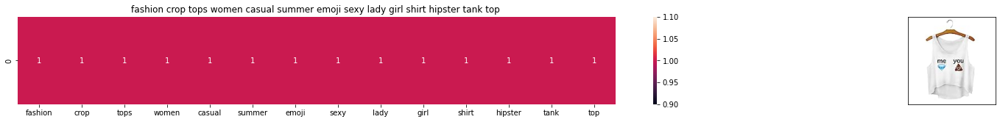

ASIN : B010V3B44G
Brand: Doxi Supermall
Title: fashion crop tops women casual summer emoji sexy lady girl shirt hipster tank top 
Euclidean similarity with the query image : 0.0


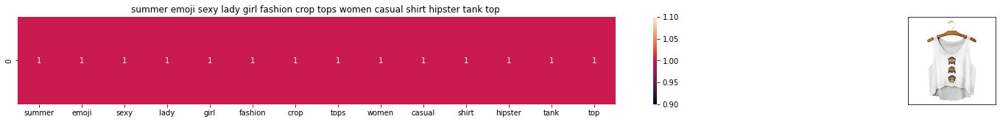

ASIN : B010V3BDII
Brand: Doxi Supermall
Title: summer emoji sexy lady girl fashion crop tops women casual shirt hipster tank top 
Euclidean similarity with the query image : 0.0


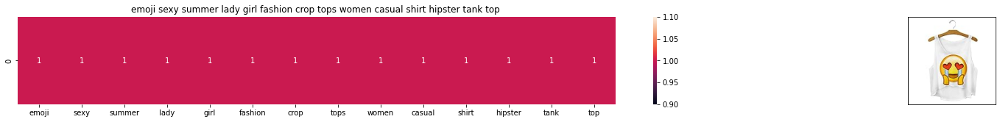

ASIN : B010V3BLWQ
Brand: Doxi Supermall
Title: emoji sexy summer lady girl fashion crop tops women casual shirt hipster tank top 
Euclidean similarity with the query image : 0.0


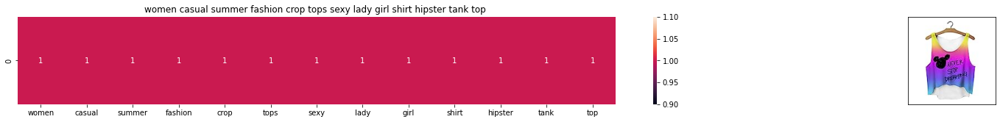

ASIN : B010V3AYSS
Brand: Doxi Supermall
Title: women casual summer fashion crop tops sexy lady girl shirt hipster tank top 
Euclidean similarity with the query image : 1.0


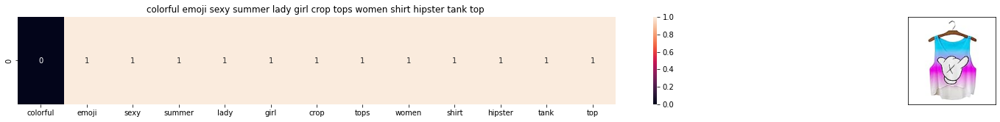

ASIN : B010V3BQZS
Brand: Doxi Supermall
Title: colorful emoji sexy summer lady girl crop tops women shirt hipster tank top 
Euclidean similarity with the query image : 1.7320508075688772


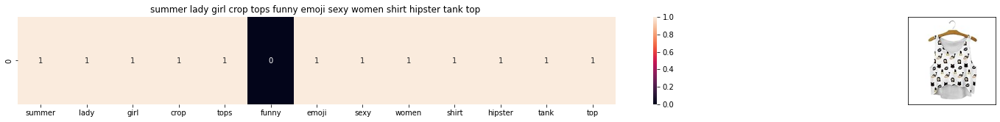

ASIN : B010V3BVMQ
Brand: Doxi Supermall
Title: summer lady girl crop tops funny emoji sexy women shirt hipster tank top 
Euclidean similarity with the query image : 1.7320508075688772


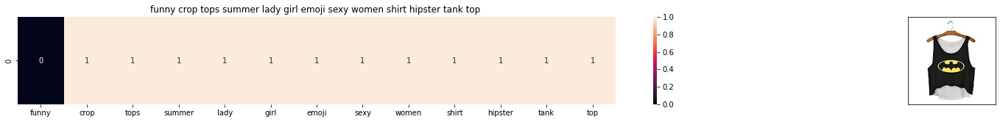

ASIN : B010V3C116
Brand: Doxi Supermall
Title: funny crop tops summer lady girl emoji sexy women shirt hipster tank top 
Euclidean similarity with the query image : 1.7320508075688772


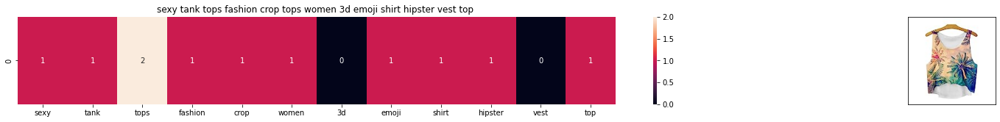

ASIN : B010V3DB9C
Brand: Doxi Supermall
Title: sexy tank tops fashion crop tops women 3d emoji shirt hipster vest top 
Euclidean similarity with the query image : 2.6457513110645907


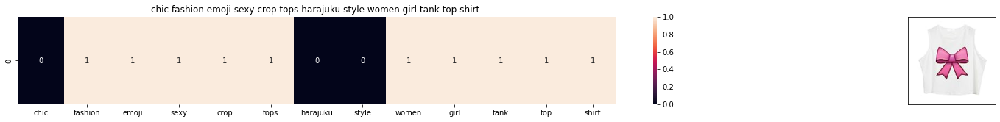

ASIN : B011RCJPR8
Brand: Chiclook Cool
Title: chic fashion emoji sexy crop tops harajuku style women girl tank top shirt 
Euclidean similarity with the query image : 2.6457513110645907


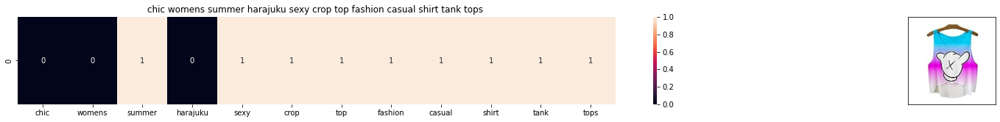

ASIN : B011RCJEMO
Brand: Chiclook Cool
Title: chic womens summer harajuku sexy crop top fashion casual shirt tank tops 
Euclidean similarity with the query image : 2.8284271247461903


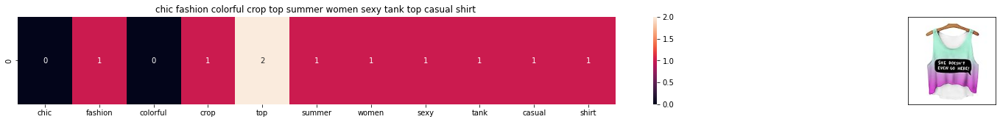

ASIN : B011RCJ6UE
Brand: Chiclook Cool
Title: chic fashion colorful crop top summer women sexy tank top casual shirt 
Euclidean similarity with the query image : 2.8284271247461903


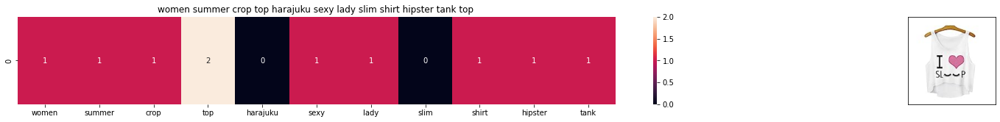

ASIN : B010V3EDEE
Brand: Doxi Supermall
Title: women summer crop top harajuku sexy lady slim shirt hipster tank top 
Euclidean similarity with the query image : 2.8284271247461903


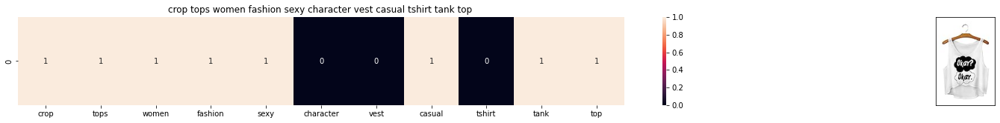

ASIN : B0107UEPVM
Brand: Mang GO
Title: crop tops women fashion sexy character vest casual tshirt tank top 
Euclidean similarity with the query image : 3.0


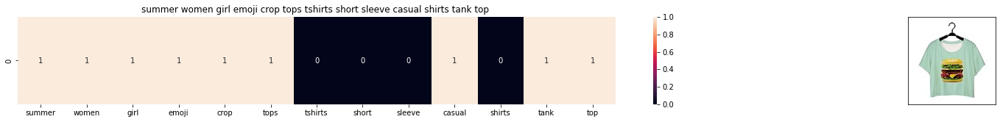

ASIN : B0124ECIU4
Brand: Doxi Supermall
Title: summer women girl emoji crop tops tshirts short sleeve casual shirts tank top 
Euclidean similarity with the query image : 3.0


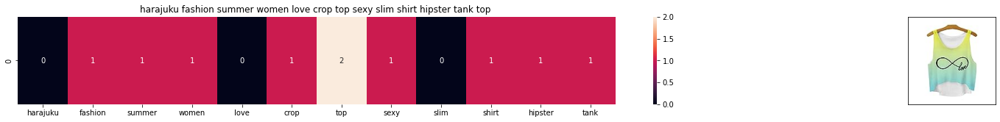

ASIN : B010V35OBU
Brand: Doxi Supermall
Title: harajuku fashion summer women love crop top sexy slim shirt hipster tank top 
Euclidean similarity with the query image : 3.0


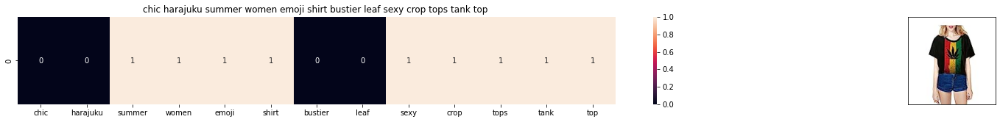

ASIN : B011UEXGH8
Brand: Chiclook Cool
Title: chic harajuku summer women emoji shirt bustier leaf sexy crop tops tank top 
Euclidean similarity with the query image : 3.0


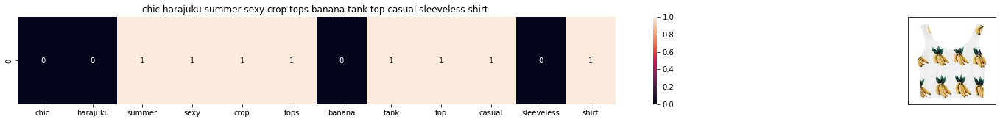

ASIN : B011RCIQBE
Brand: Chiclook Cool
Title: chic harajuku summer sexy crop tops banana tank top casual sleeveless shirt 
Euclidean similarity with the query image : 3.1622776601683795


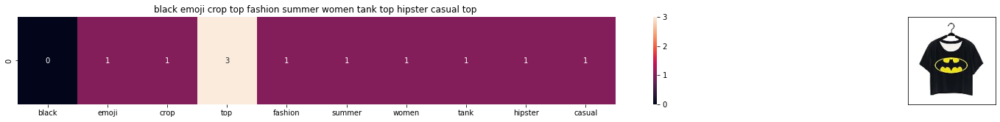

ASIN : B0124E80M4
Brand: Doxi Supermall
Title: black emoji crop top fashion summer women tank top hipster casual top 
Euclidean similarity with the query image : 3.1622776601683795


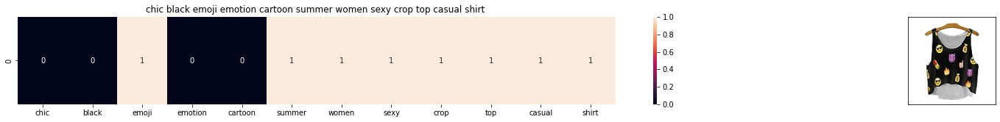

ASIN : B011RCJ4M4
Brand: Chiclook Cool
Title: chic black emoji emotion cartoon summer women sexy crop top casual shirt 
Euclidean similarity with the query image : 3.1622776601683795


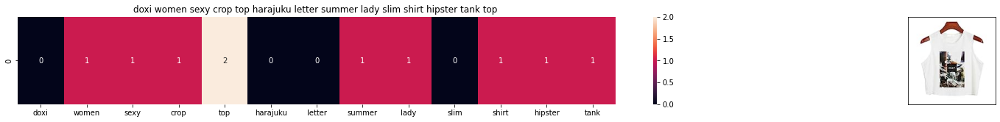

ASIN : B010V39146
Brand: Doxi Supermall
Title: doxi women sexy crop top harajuku letter summer lady slim shirt hipster tank top 
Euclidean similarity with the query image : 3.1622776601683795


In [44]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(product_data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],product_data['title'].loc[df_indices[0]], product_data['title'].loc[df_indices[i]], product_data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',product_data['asin'].loc[df_indices[i]])
        print ('Brand:', product_data['brand'].loc[df_indices[i]])
        print ('Title:', product_data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

#call the bag-of-words model for a product to get similar products.
bag_of_words_model(12566, 20) # change the index if you want to.
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.
#try 12566
#try 931

<h2>TF-IDF based product similarity</h2>

In [45]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 0)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(product_data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

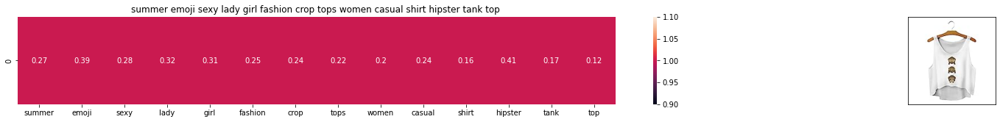

ASIN : B010V3BDII
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.0


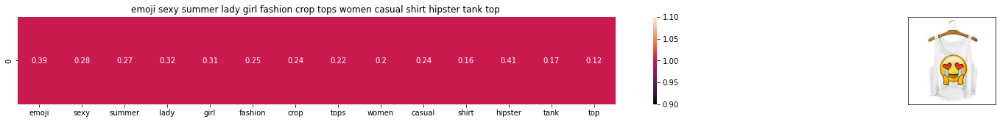

ASIN : B010V3BLWQ
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.0


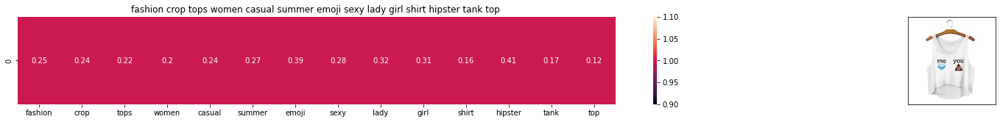

ASIN : B010V3B44G
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.0


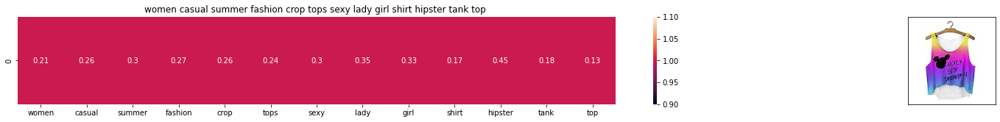

ASIN : B010V3AYSS
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.40138594750235


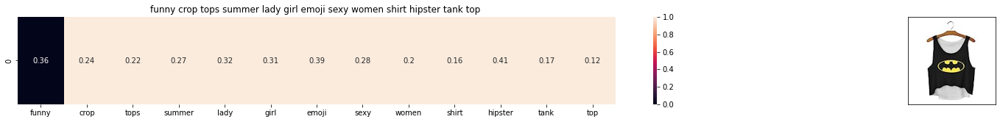

ASIN : B010V3C116
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.49544215538955555


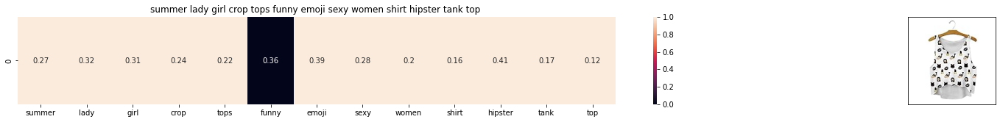

ASIN : B010V3BVMQ
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.49544215538955555


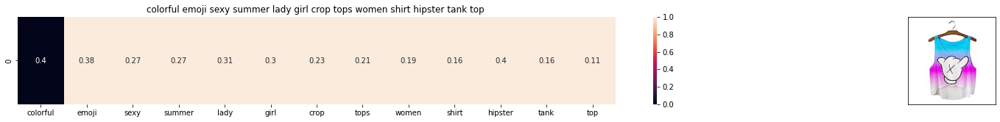

ASIN : B010V3BQZS
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.5241689140292634


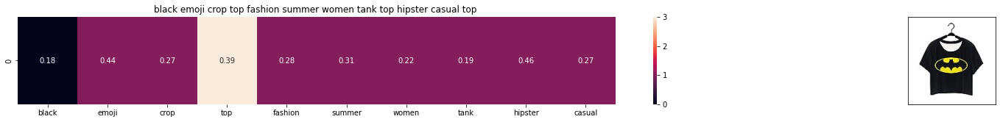

ASIN : B0124E80M4
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.684158162664275


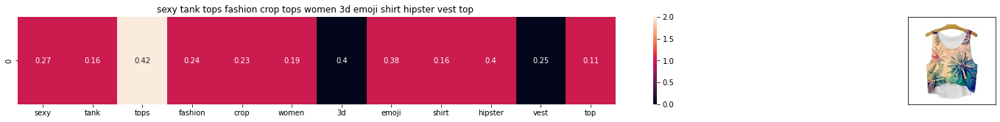

ASIN : B010V3DB9C
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.7731343455110792


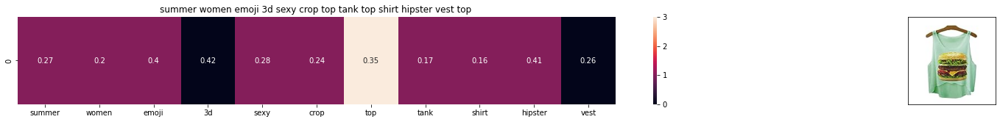

ASIN : B010V3E5EC
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.8128754313990525


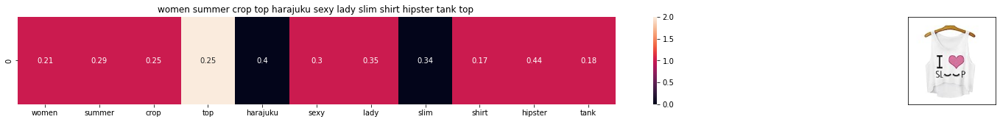

ASIN : B010V3EDEE
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.8437056912864757


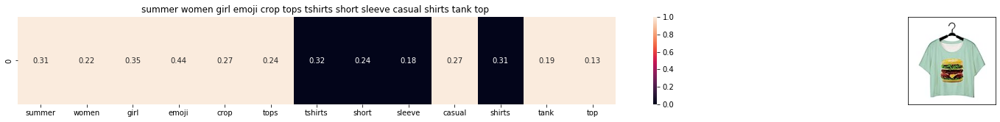

ASIN : B0124ECIU4
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.8553483954246192


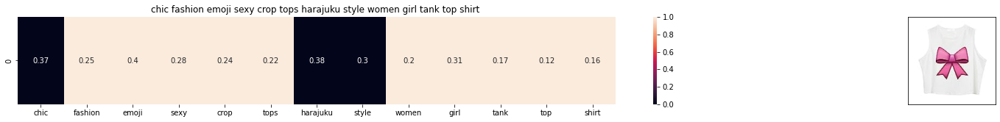

ASIN : B011RCJPR8
BRAND : Chiclook Cool
Eucliden distance from the given image : 0.8826321316686153


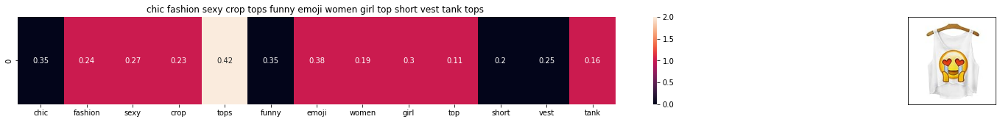

ASIN : B011RCJH58
BRAND : Chiclook Cool
Eucliden distance from the given image : 0.9004017468013861


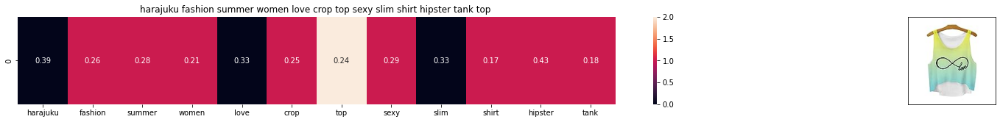

ASIN : B010V35OBU
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9172816572673457


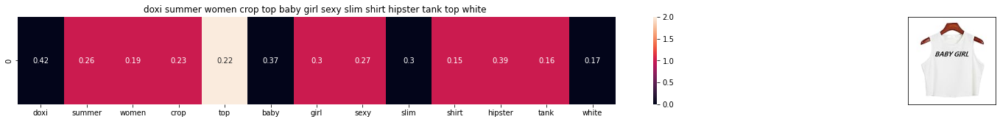

ASIN : B010V3A23U
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9303848929561548


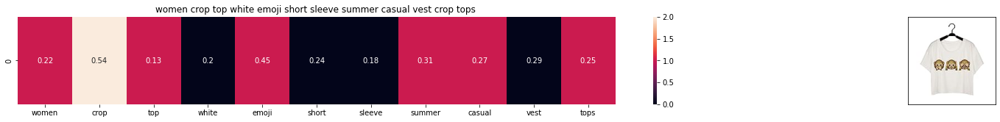

ASIN : B0124E7MHS
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9334421080980745


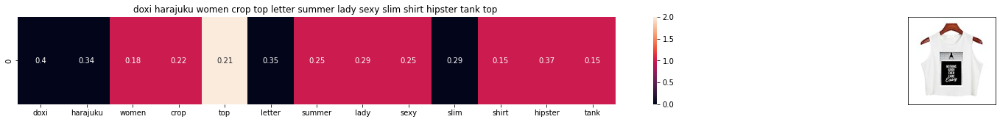

ASIN : B010V380LQ
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9525344637195033


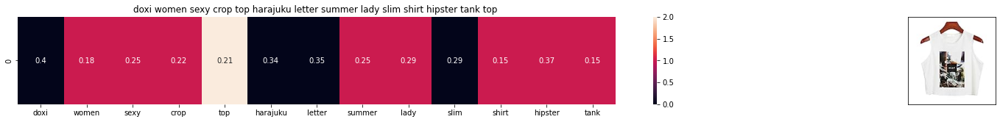

ASIN : B010V39146
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9525344637195033


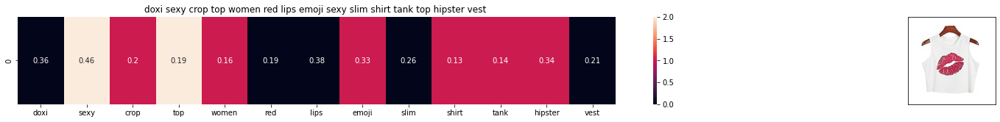

ASIN : B010TKXEHG
BRAND : Doxi Supermall
Eucliden distance from the given image : 0.9560708174154957


In [46]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(product_data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], product_data['title'].loc[df_indices[0]], product_data['title'].loc[df_indices[i]], product_data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',product_data['asin'].loc[df_indices[i]])
        print('BRAND :',product_data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(12566, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

<h2>IDF Based Product Similarity</h2>

In [47]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(product_data['title'])

# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

In [48]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in product_data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(product_data.shape[0] / (n_containing(word)))

In [49]:
# # we need to convert the values into float
# idf_title_features  = idf_title_features.astype(np.float)

# for i in idf_title_vectorizer.vocabulary_.keys():
#     # for every word in whole corpus we will find its idf value
#     idf_val = idf(i)
    
#     # to calculate idf_title_features we need to replace the count values with the idf values of the word
#     # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
#     for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
#         # we replace the count values of word i in document j with  idf_value of word i 
#         # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
#         idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        
        
        
import math

# Assuming you have defined the function n_containing(word) that returns the number of documents containing the given word

def idf(word):
    # Get the number of documents containing the given word
    doc_containing_word = n_containing(word)
    
    # If there are no documents containing the word, return IDF as 0
    if doc_containing_word == 0:
        return 0.0

    # IDF = log(#number of docs / #number of docs which had the given word)
    return math.log(product_data.shape[0] / doc_containing_word)


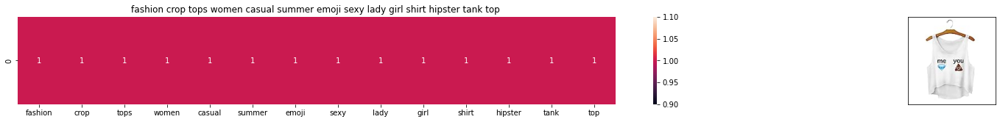

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from the given image : 0.0


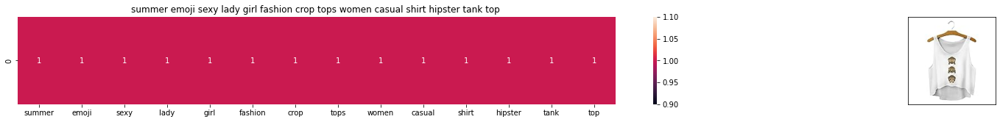

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from the given image : 0.0


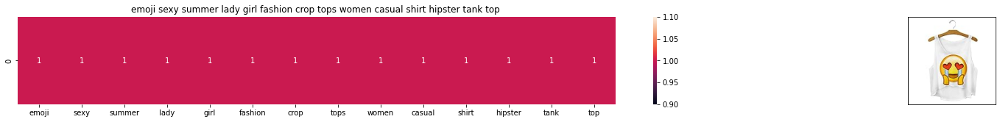

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from the given image : 0.0


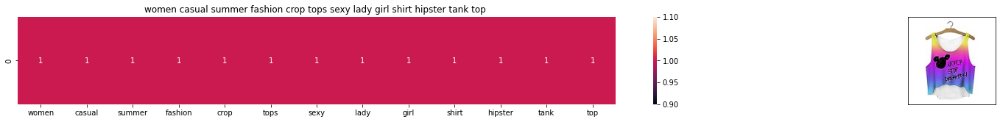

ASIN : B010V3AYSS
Brand : Doxi Supermall
euclidean distance from the given image : 1.0


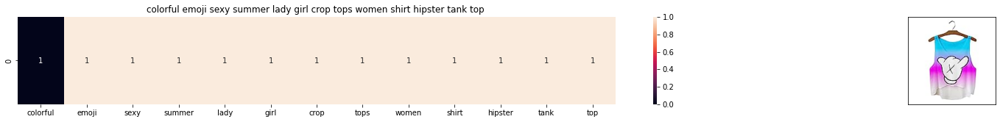

ASIN : B010V3BQZS
Brand : Doxi Supermall
euclidean distance from the given image : 1.7320508075688772


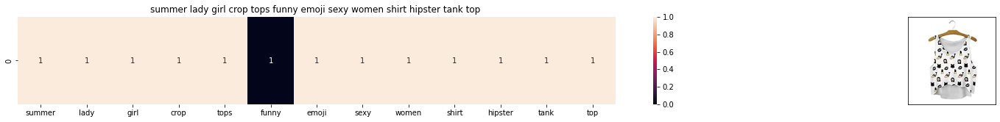

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from the given image : 1.7320508075688772


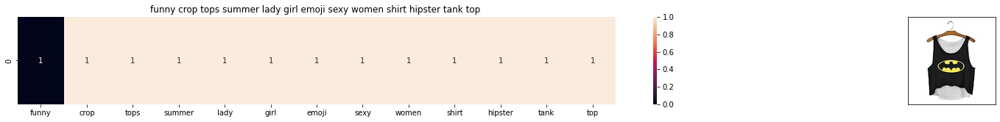

ASIN : B010V3C116
Brand : Doxi Supermall
euclidean distance from the given image : 1.7320508075688772


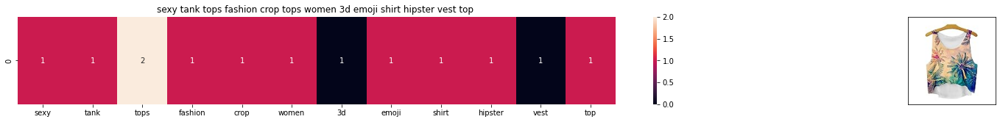

ASIN : B010V3DB9C
Brand : Doxi Supermall
euclidean distance from the given image : 2.6457513110645907


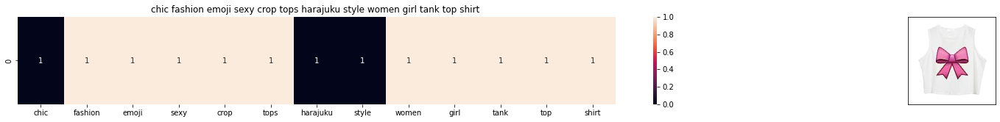

ASIN : B011RCJPR8
Brand : Chiclook Cool
euclidean distance from the given image : 2.6457513110645907


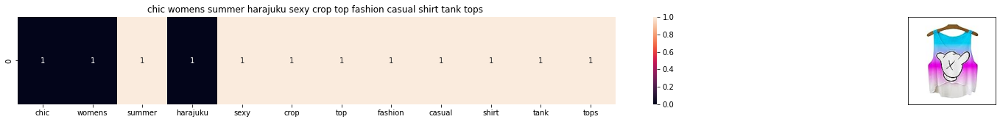

ASIN : B011RCJEMO
Brand : Chiclook Cool
euclidean distance from the given image : 2.8284271247461903


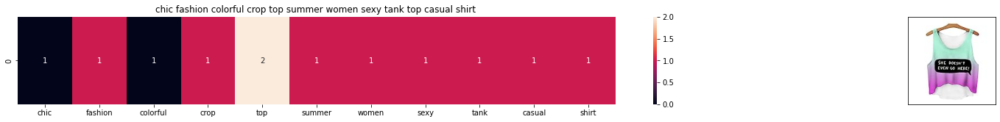

ASIN : B011RCJ6UE
Brand : Chiclook Cool
euclidean distance from the given image : 2.8284271247461903


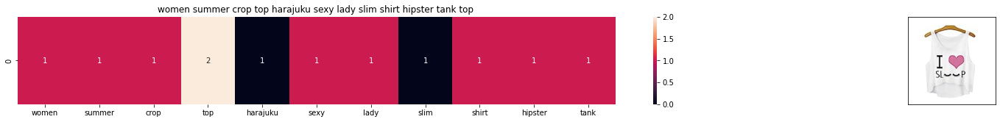

ASIN : B010V3EDEE
Brand : Doxi Supermall
euclidean distance from the given image : 2.8284271247461903


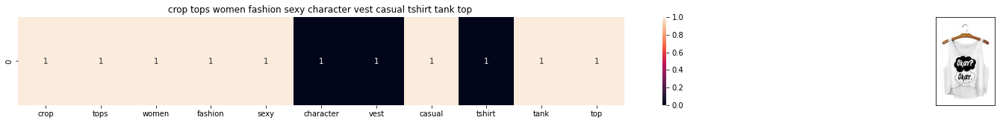

ASIN : B0107UEPVM
Brand : Mang GO
euclidean distance from the given image : 3.0


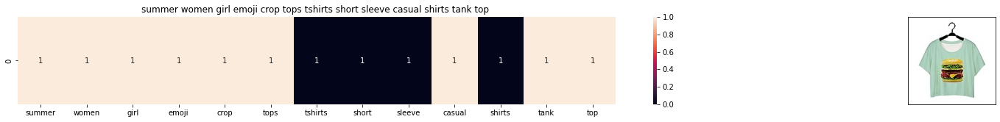

ASIN : B0124ECIU4
Brand : Doxi Supermall
euclidean distance from the given image : 3.0


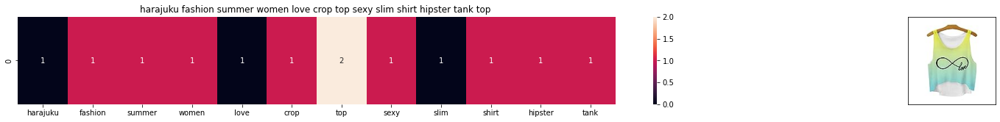

ASIN : B010V35OBU
Brand : Doxi Supermall
euclidean distance from the given image : 3.0


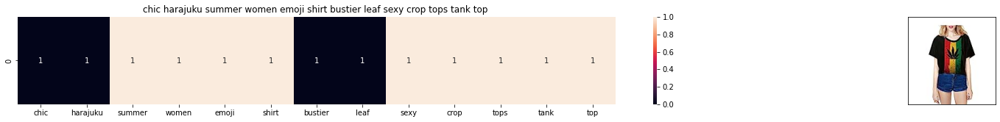

ASIN : B011UEXGH8
Brand : Chiclook Cool
euclidean distance from the given image : 3.0


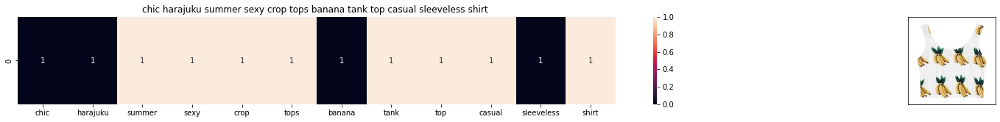

ASIN : B011RCIQBE
Brand : Chiclook Cool
euclidean distance from the given image : 3.1622776601683795


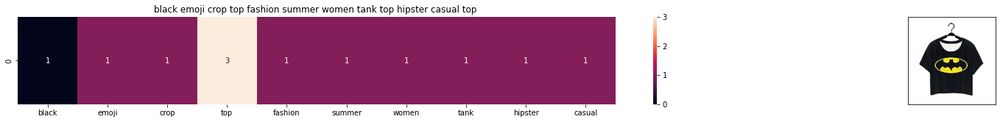

ASIN : B0124E80M4
Brand : Doxi Supermall
euclidean distance from the given image : 3.1622776601683795


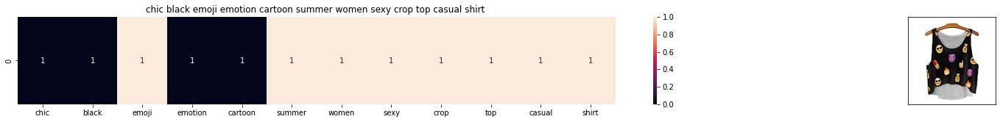

ASIN : B011RCJ4M4
Brand : Chiclook Cool
euclidean distance from the given image : 3.1622776601683795


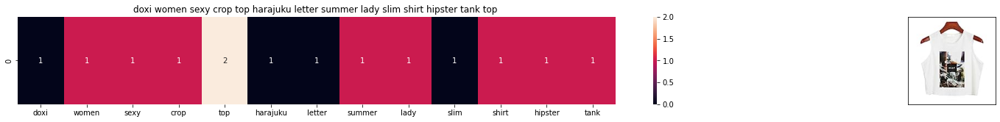

ASIN : B010V39146
Brand : Doxi Supermall
euclidean distance from the given image : 3.1622776601683795


In [50]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(product_data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],product_data['title'].loc[df_indices[0]], product_data['title'].loc[df_indices[i]], product_data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',product_data['asin'].loc[df_indices[i]])
        print('Brand :',product_data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        
idf_model(12566,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

<h2>Text Semantics based product similarity</h2>

In [51]:

# credits: https://www.kaggle.com/c/word2vec-nlp-tutorial#part-2-word-vectors
# Custom Word2Vec using your own text data.
# Do NOT RUN this code.
# It is meant as a reference to build your own Word2Vec when you have 
# lots of data.

'''
# Set values for various parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 1    # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size                                                                                    
downsampling = 1e-3   # Downsample setting for frequent words

# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print ("Training model...")
model = word2vec.Word2Vec(sen_corpus, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)
    
'''

'\n# Set values for various parameters\nnum_features = 300    # Word vector dimensionality                      \nmin_word_count = 1    # Minimum word count                        \nnum_workers = 4       # Number of threads to run in parallel\ncontext = 10          # Context window size                                                                                    \ndownsampling = 1e-3   # Downsample setting for frequent words\n\n# Initialize and train the model (this will take some time)\nfrom gensim.models import word2vec\nprint ("Training model...")\nmodel = word2vec.Word2Vec(sen_corpus, workers=num_workers,             size=num_features, min_count = min_word_count,             window = context)\n    \n'

In [52]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.

'''
model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
'''

#if you do NOT have RAM >= 12GB, use the code below.
with open('word2vec_model', 'rb') as handle:
    model = pickle.load(handle)


In [53]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [54]:
# vocab = stores all the words that are there in google w2v model
# vocab = model.wv.vocab.keys() # if you are using Google word2Vec

vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

<h2>Average Word2Vec product similarity.</h2>

In [55]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in product_data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)


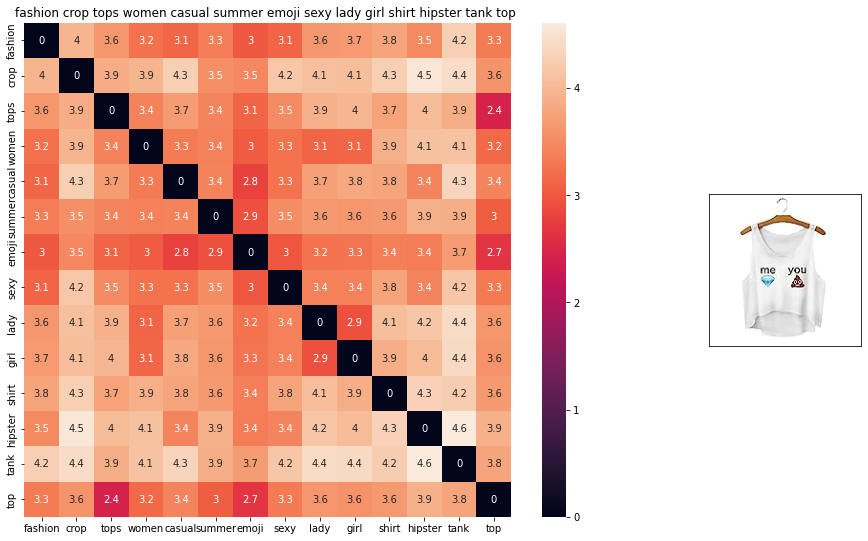

ASIN : B010V3B44G
BRAND : Doxi Supermall
euclidean distance from given input image : 0.0


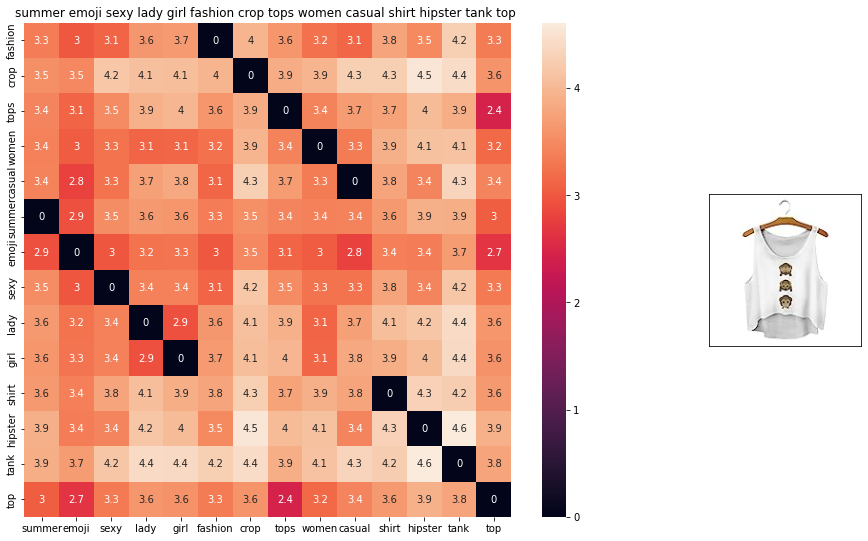

ASIN : B010V3BDII
BRAND : Doxi Supermall
euclidean distance from given input image : 0.0


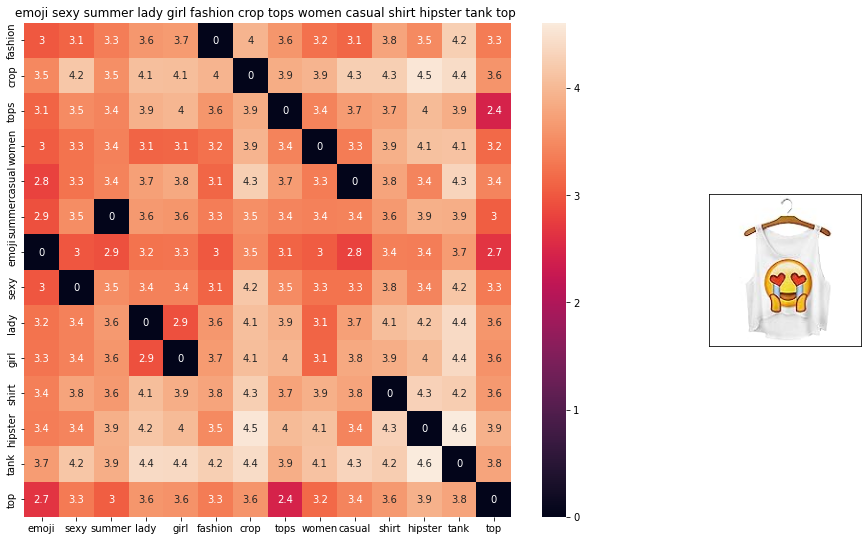

ASIN : B010V3BLWQ
BRAND : Doxi Supermall
euclidean distance from given input image : 0.0


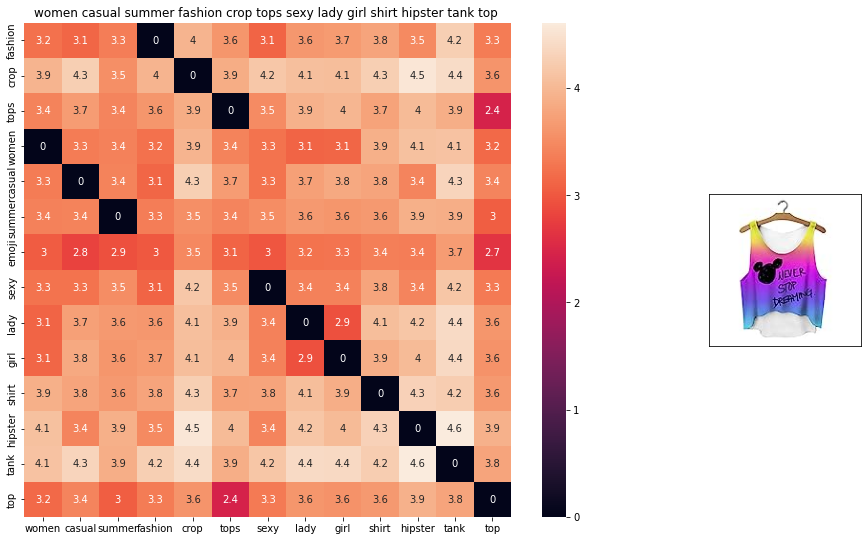

ASIN : B010V3AYSS
BRAND : Doxi Supermall
euclidean distance from given input image : 0.13368244


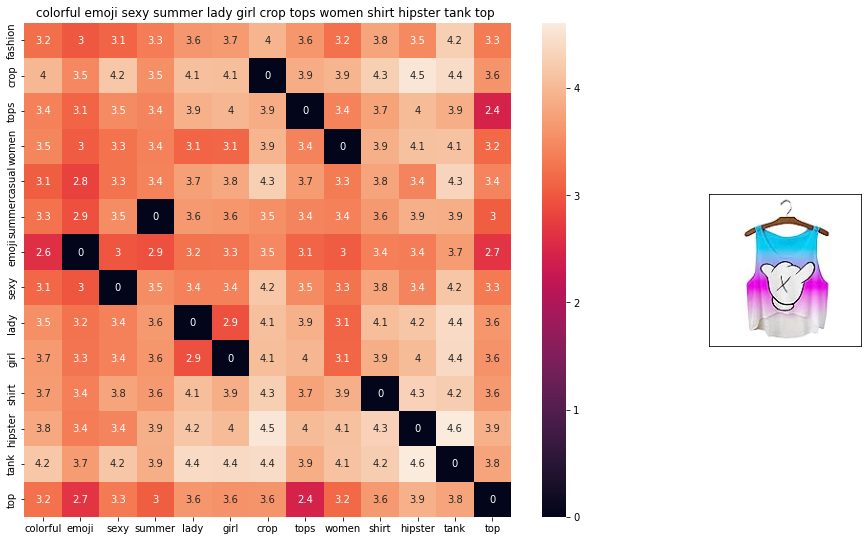

ASIN : B010V3BQZS
BRAND : Doxi Supermall
euclidean distance from given input image : 0.29837728


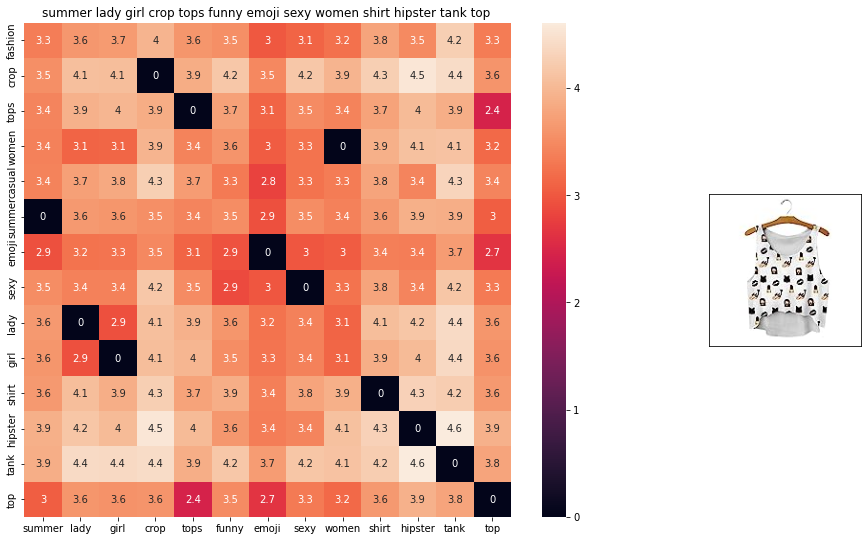

ASIN : B010V3BVMQ
BRAND : Doxi Supermall
euclidean distance from given input image : 0.3274634


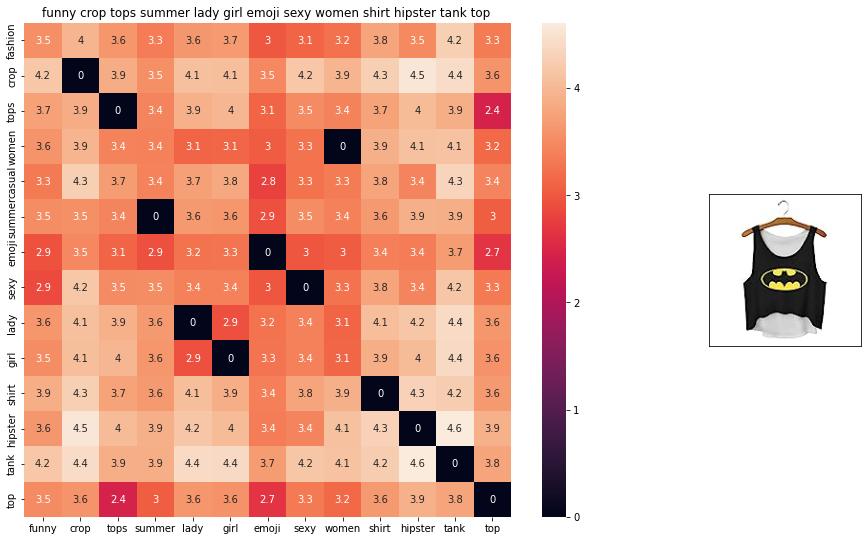

ASIN : B010V3C116
BRAND : Doxi Supermall
euclidean distance from given input image : 0.3274634


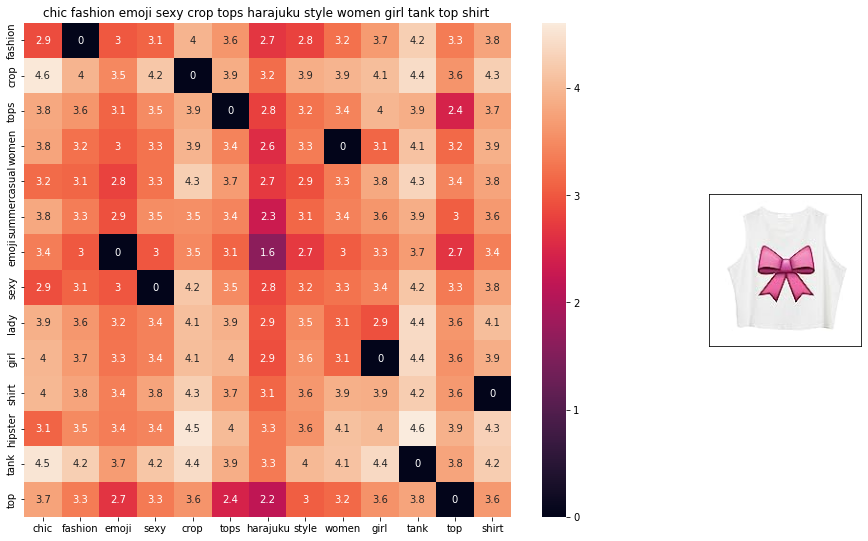

ASIN : B011RCJPR8
BRAND : Chiclook Cool
euclidean distance from given input image : 0.40975842


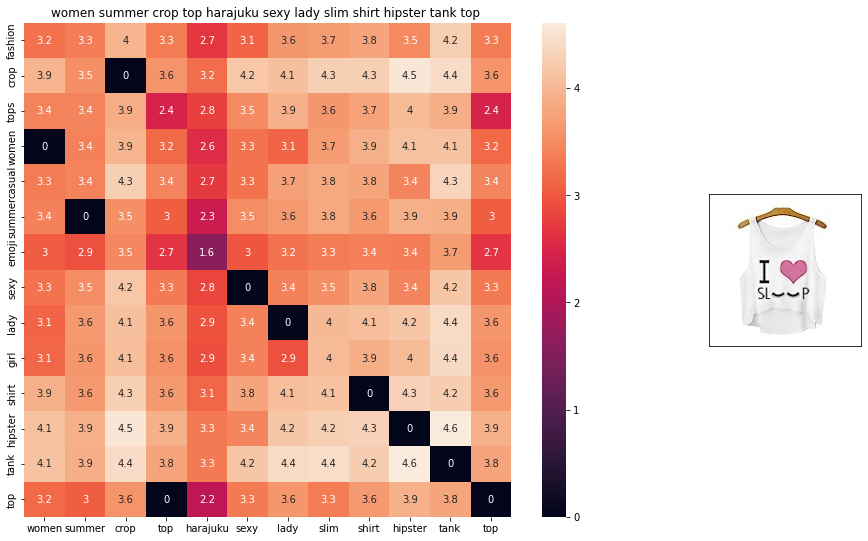

ASIN : B010V3EDEE
BRAND : Doxi Supermall
euclidean distance from given input image : 0.46806592


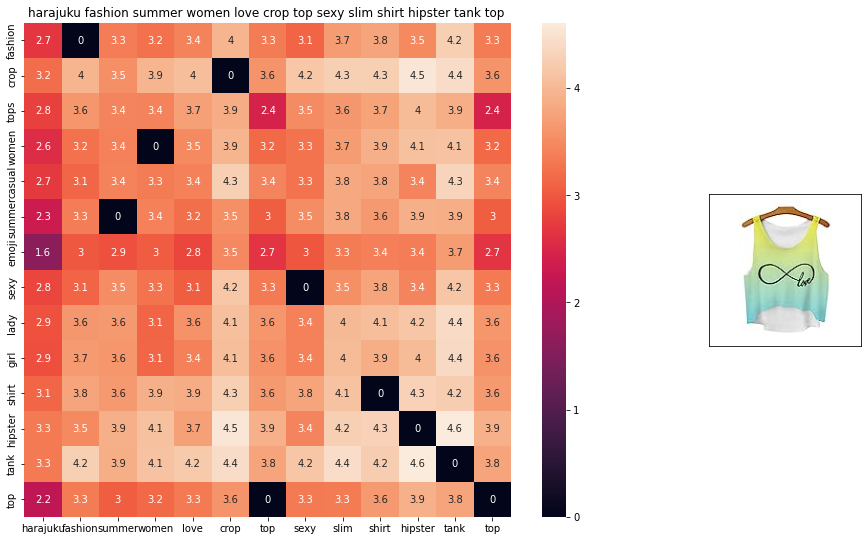

ASIN : B010V35OBU
BRAND : Doxi Supermall
euclidean distance from given input image : 0.4957314


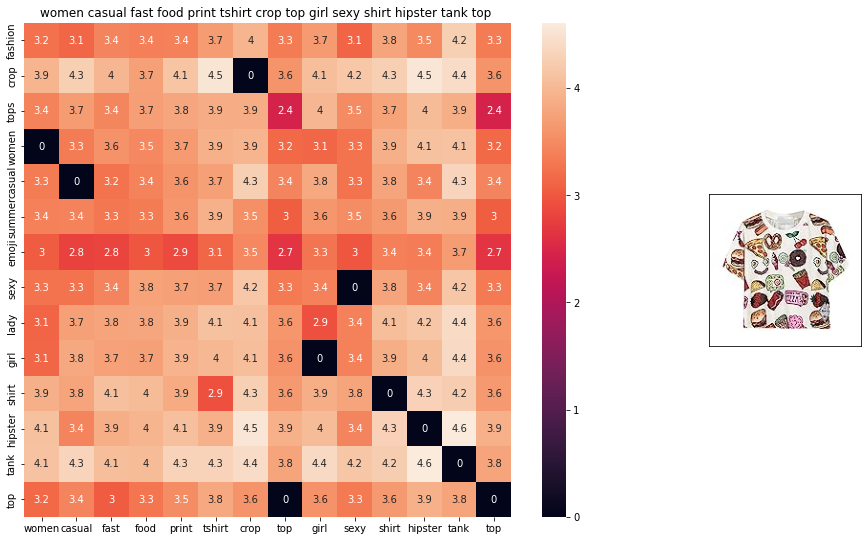

ASIN : B010V3AB5O
BRAND : Doxi Supermall
euclidean distance from given input image : 0.50107545


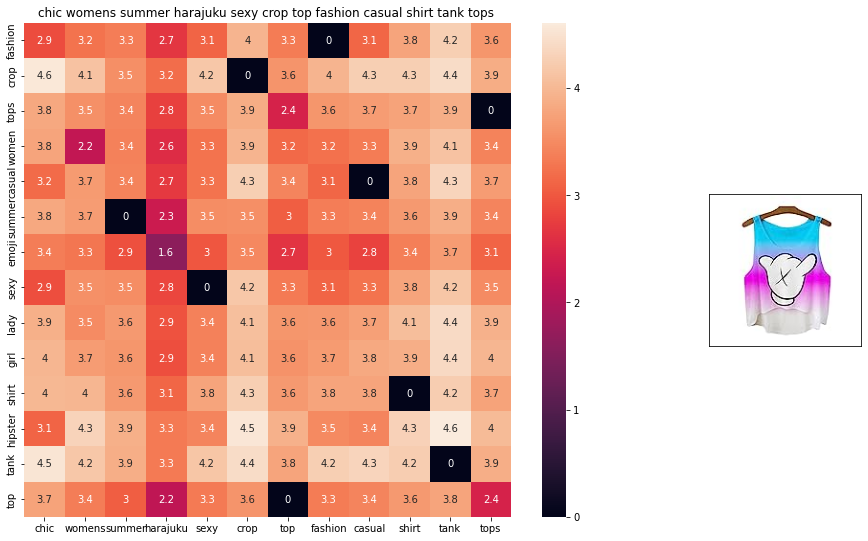

ASIN : B011RCJEMO
BRAND : Chiclook Cool
euclidean distance from given input image : 0.5027281


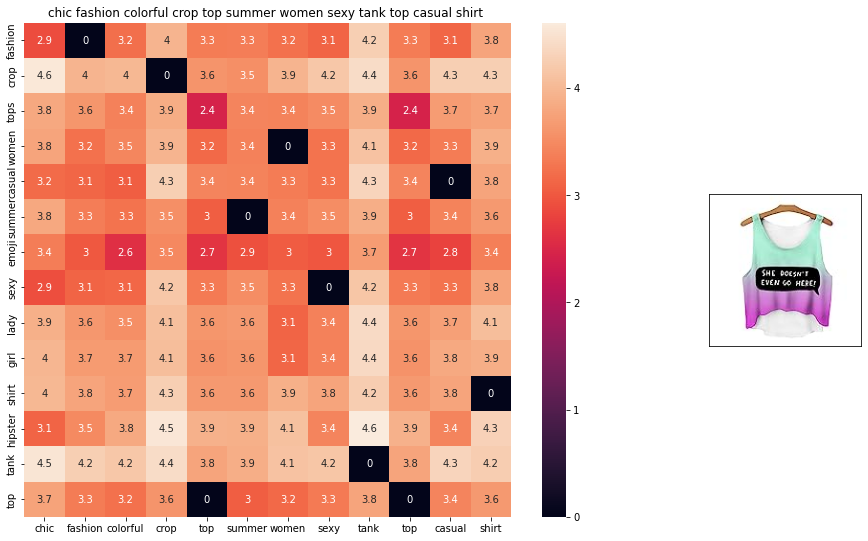

ASIN : B011RCJ6UE
BRAND : Chiclook Cool
euclidean distance from given input image : 0.5073639


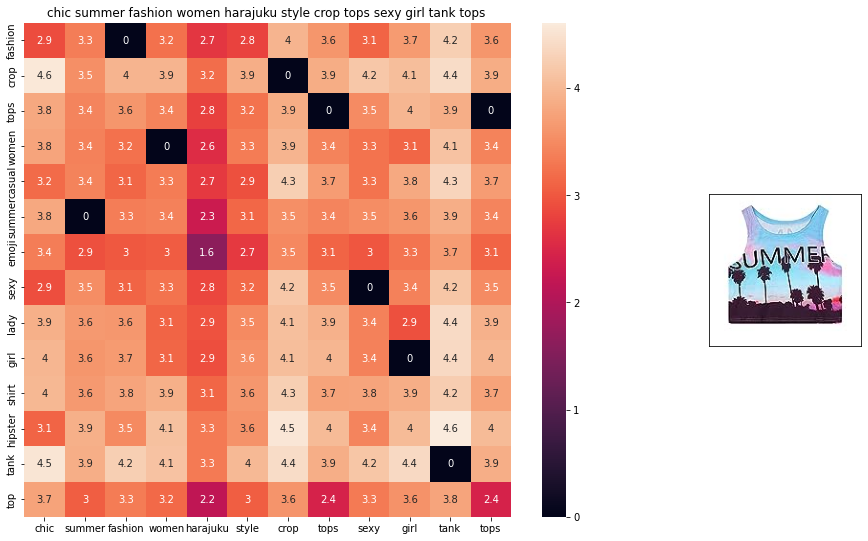

ASIN : B011OU51US
BRAND : Chiclook Cool
euclidean distance from given input image : 0.5160891


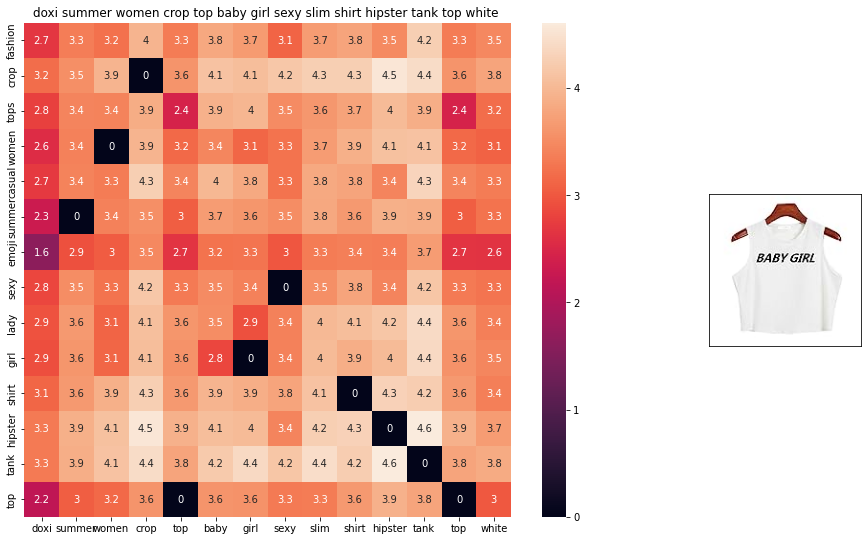

ASIN : B010V3A23U
BRAND : Doxi Supermall
euclidean distance from given input image : 0.5262789


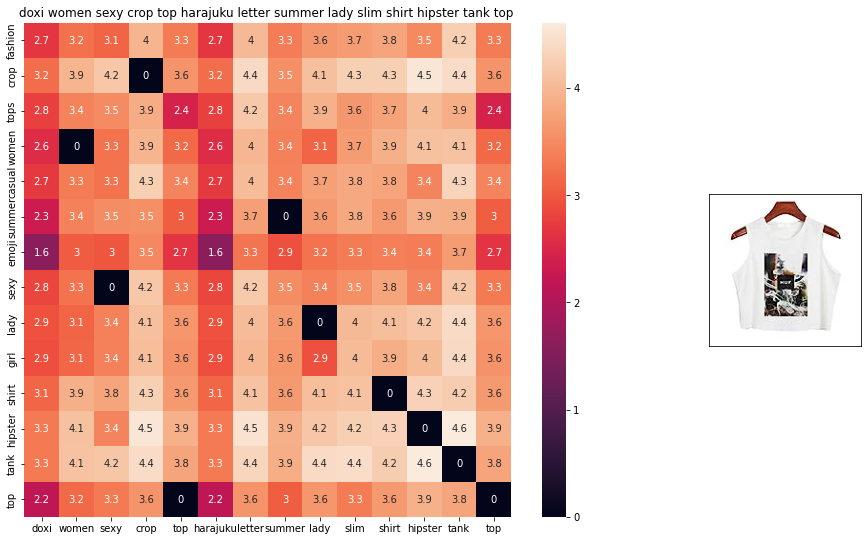

ASIN : B010V39146
BRAND : Doxi Supermall
euclidean distance from given input image : 0.5270717


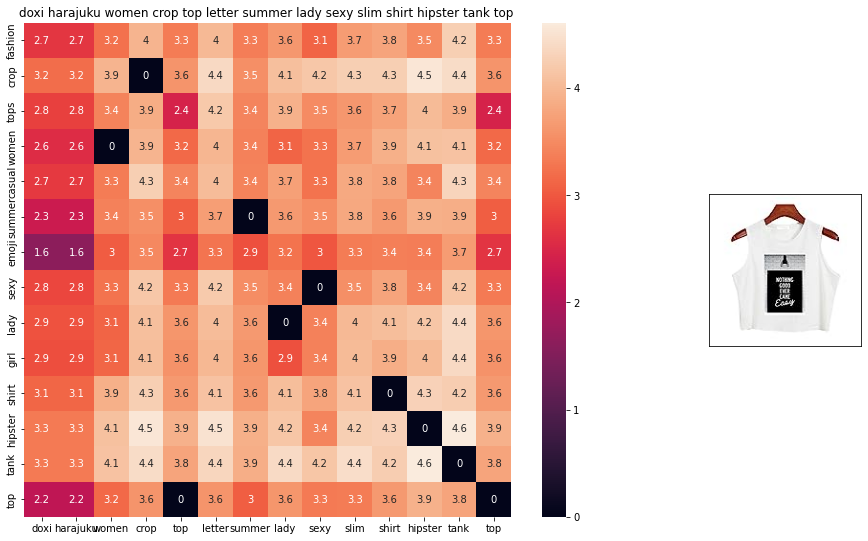

ASIN : B010V380LQ
BRAND : Doxi Supermall
euclidean distance from given input image : 0.5270717


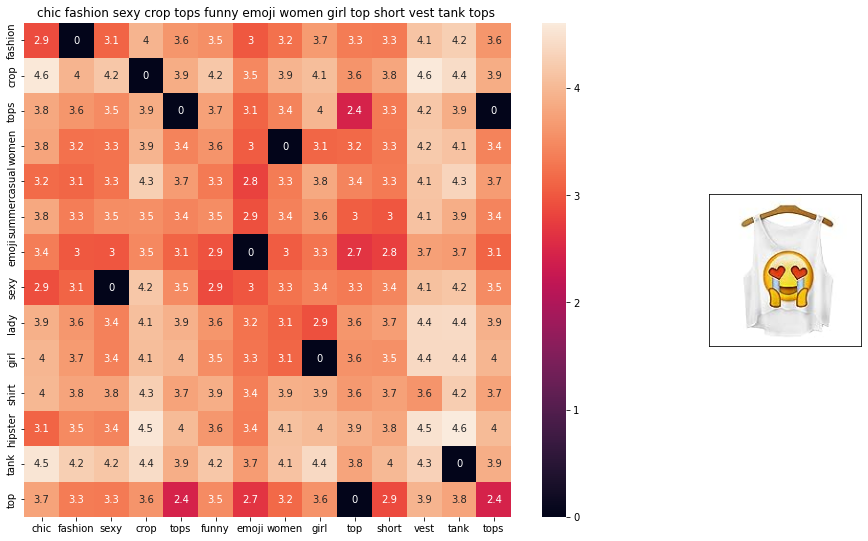

ASIN : B011RCJH58
BRAND : Chiclook Cool
euclidean distance from given input image : 0.52816993


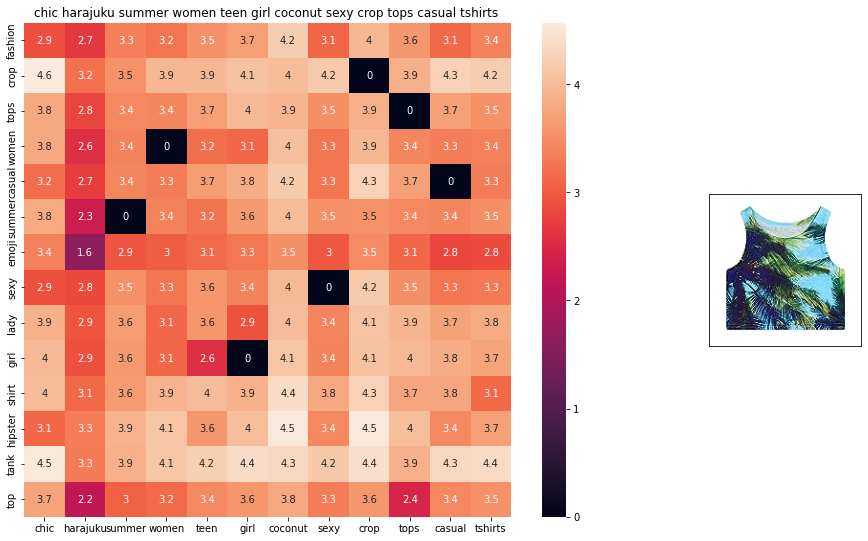

ASIN : B011OU4R08
BRAND : Chiclook Cool
euclidean distance from given input image : 0.5545634


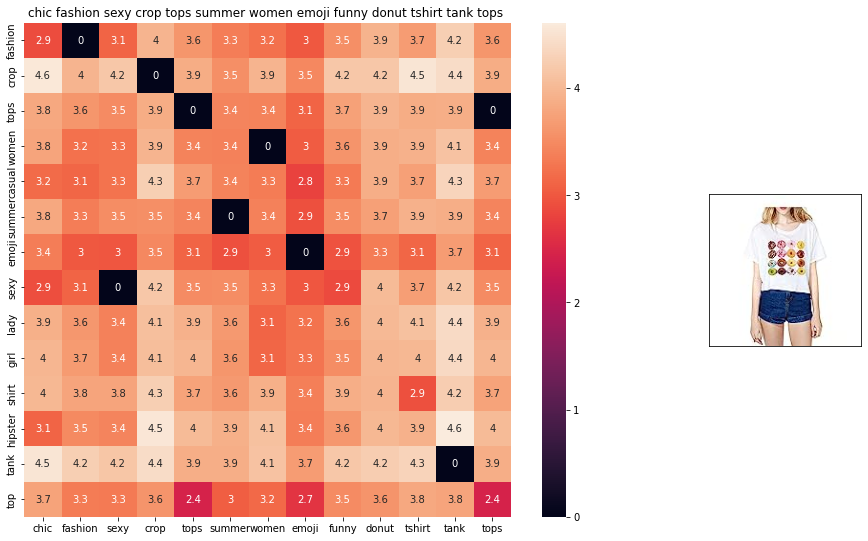

ASIN : B011UEUTQE
BRAND : Chiclook Cool
euclidean distance from given input image : 0.57349175


In [56]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(product_data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(product_data['title'].loc[df_indices[0]],product_data['title'].loc[df_indices[i]], product_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',product_data['asin'].loc[df_indices[i]])
        print('BRAND :',product_data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12566, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

<h2>IDF weighted Word2Vec for product similarity</h2>

In [57]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in product_data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

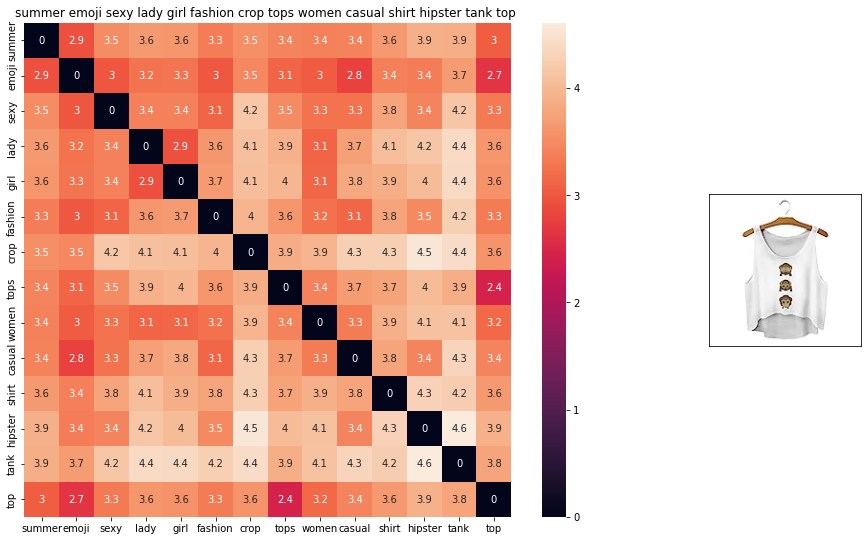

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from input : 0.0


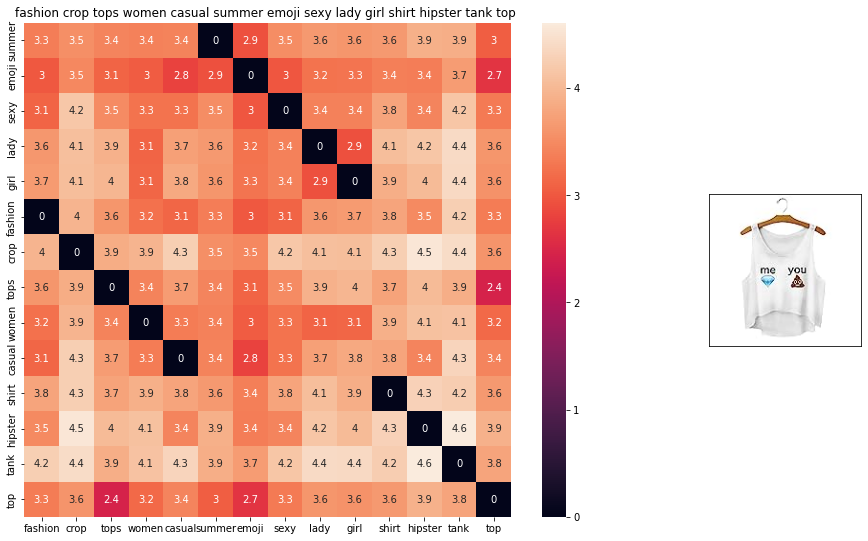

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from input : 0.0


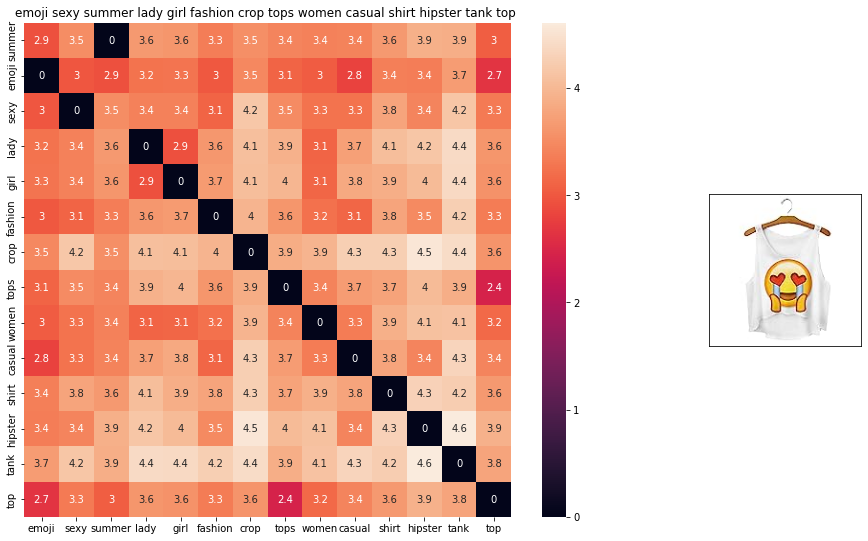

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from input : 0.0


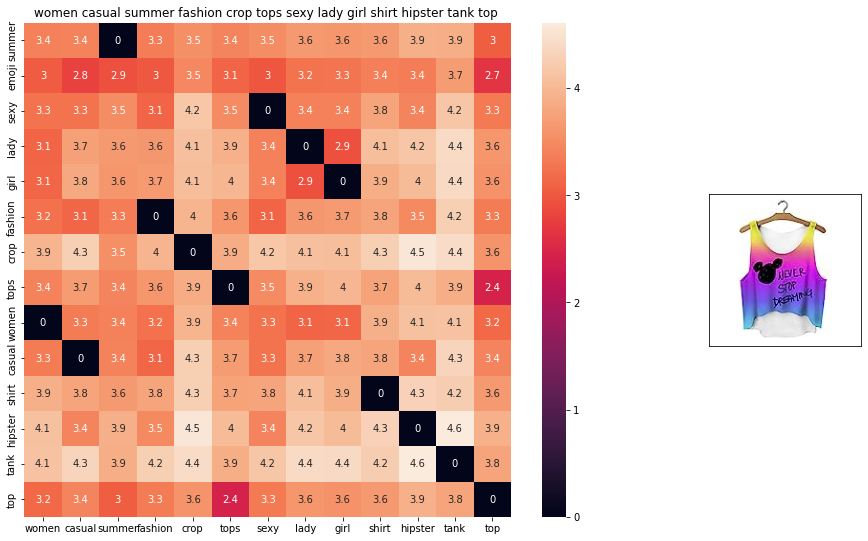

ASIN : B010V3AYSS
Brand : Doxi Supermall
euclidean distance from input : 0.13368244


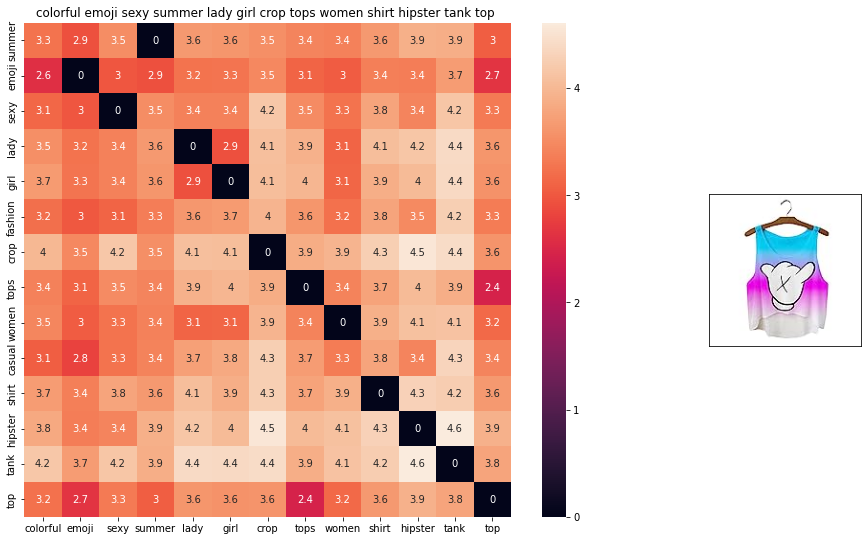

ASIN : B010V3BQZS
Brand : Doxi Supermall
euclidean distance from input : 0.29837728


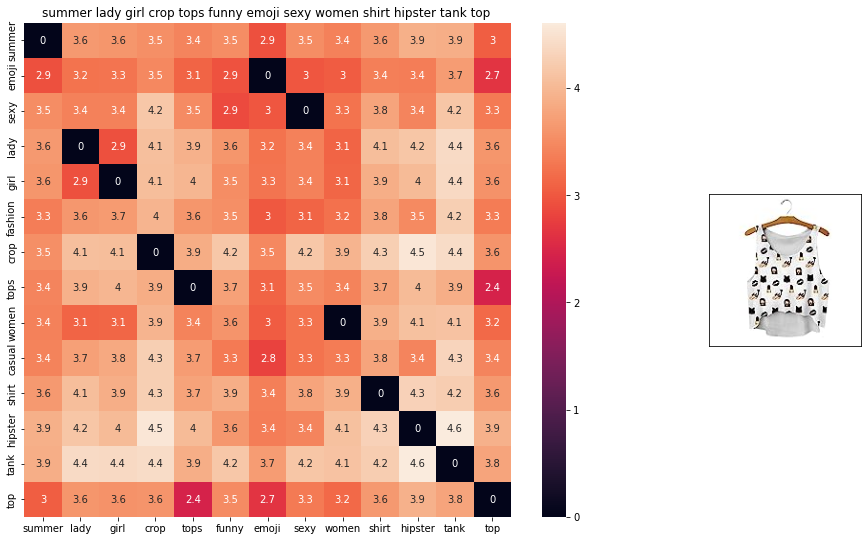

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from input : 0.3274634


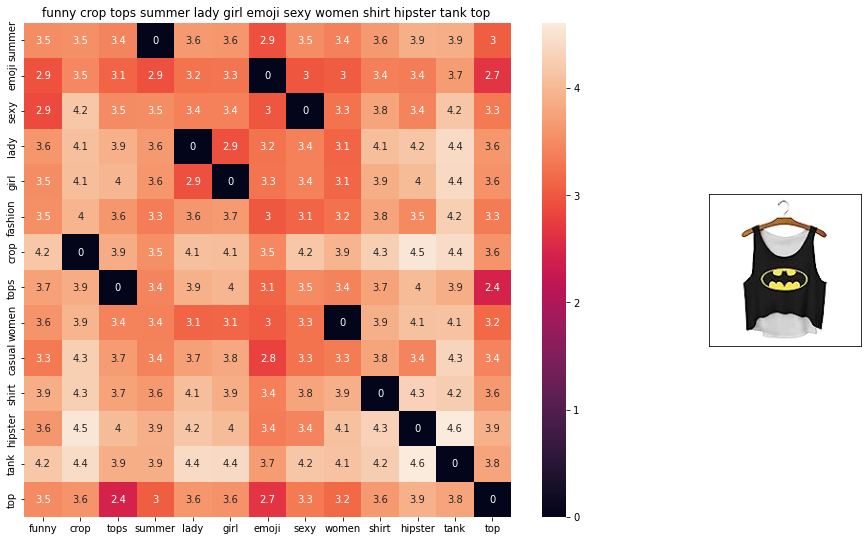

ASIN : B010V3C116
Brand : Doxi Supermall
euclidean distance from input : 0.3274634


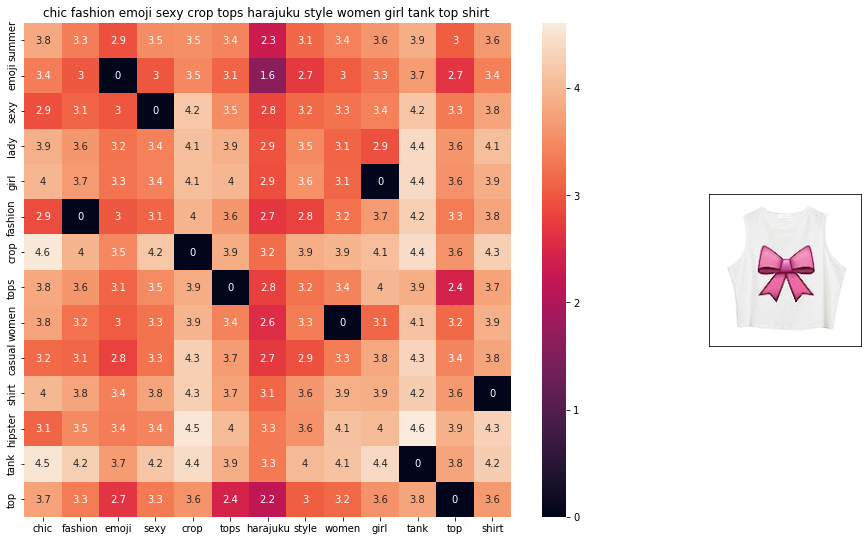

ASIN : B011RCJPR8
Brand : Chiclook Cool
euclidean distance from input : 0.40975842


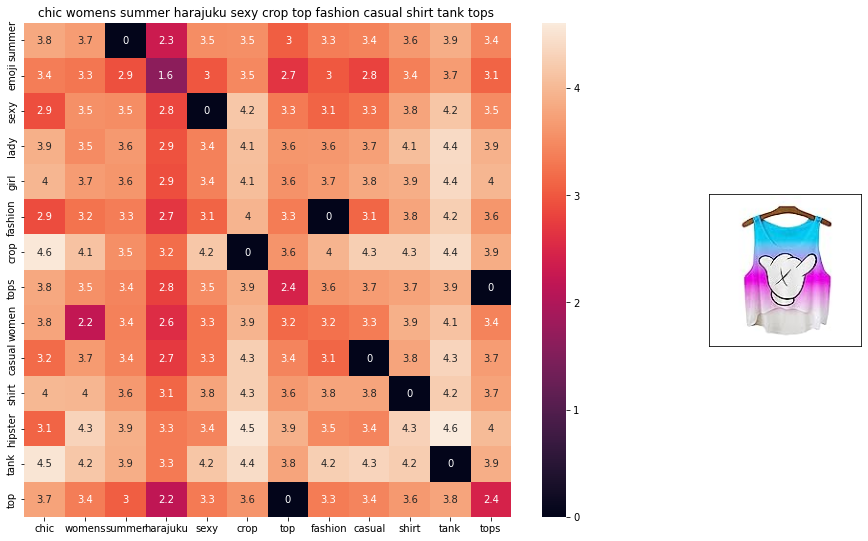

ASIN : B011RCJEMO
Brand : Chiclook Cool
euclidean distance from input : 0.5027281


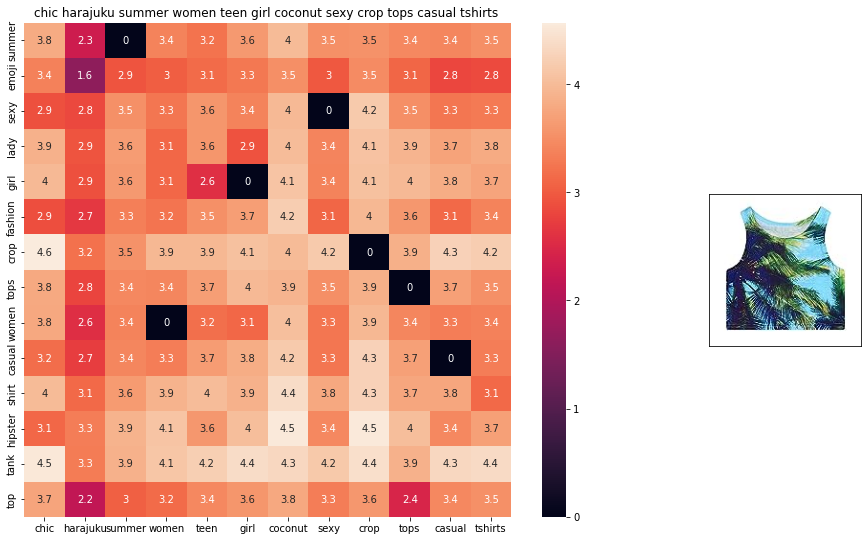

ASIN : B011OU4R08
Brand : Chiclook Cool
euclidean distance from input : 0.5545634


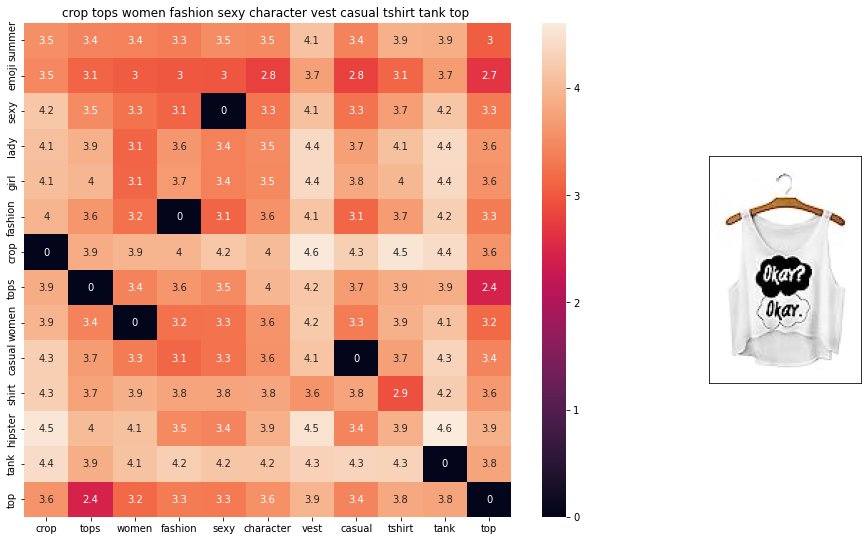

ASIN : B0107UEPVM
Brand : Mang GO
euclidean distance from input : 0.5737642


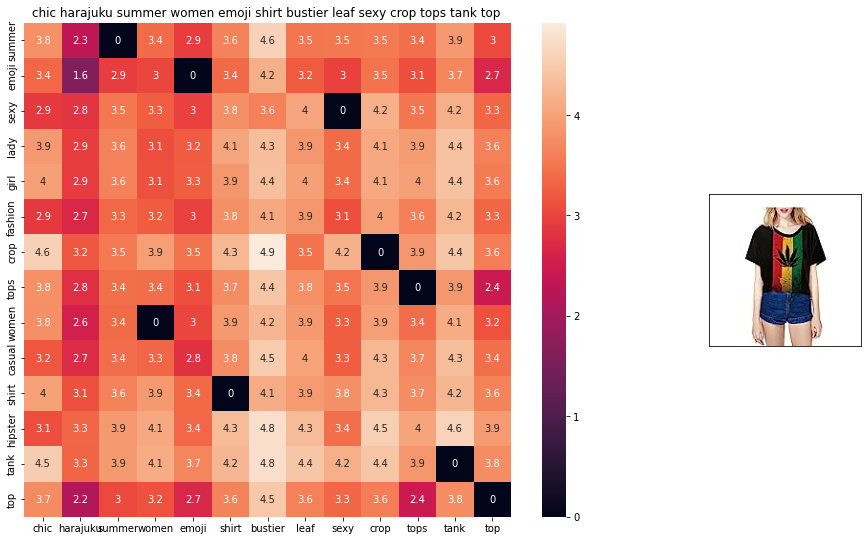

ASIN : B011UEXGH8
Brand : Chiclook Cool
euclidean distance from input : 0.59502506


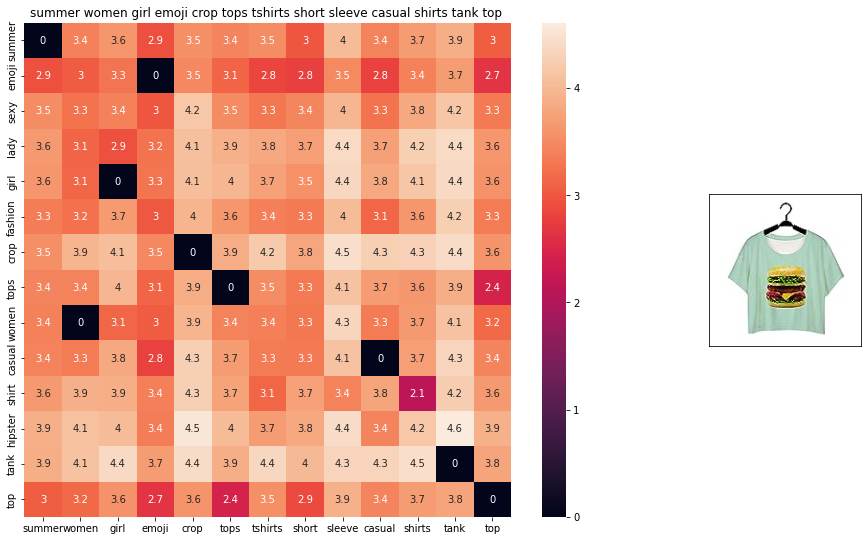

ASIN : B0124ECIU4
Brand : Doxi Supermall
euclidean distance from input : 0.59895265


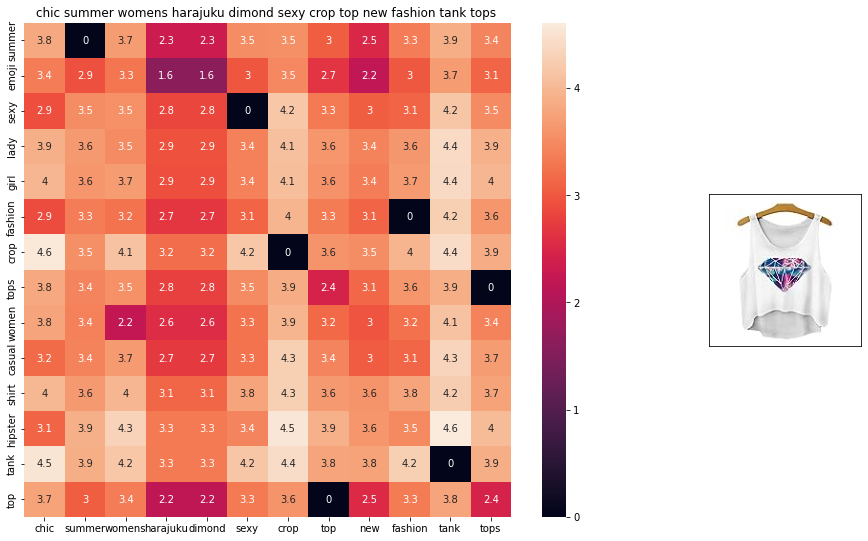

ASIN : B011RCINTY
Brand : Chiclook Cool
euclidean distance from input : 0.6102398


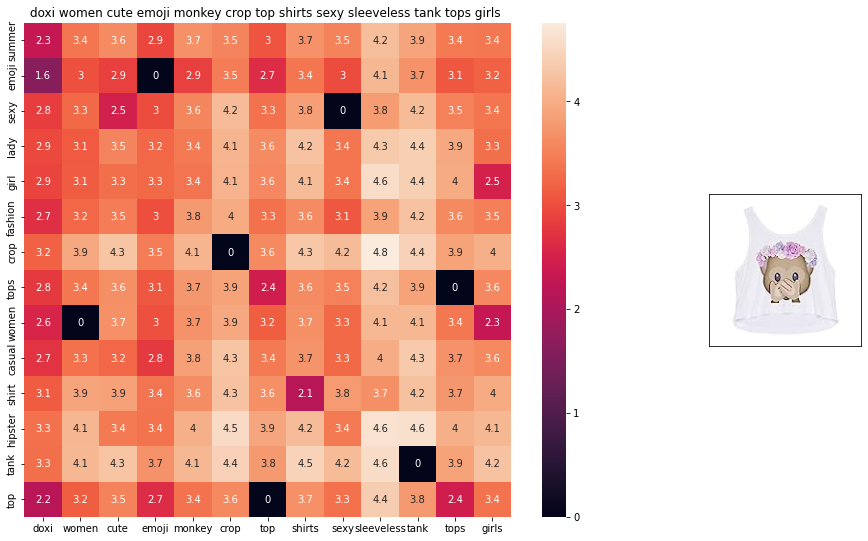

ASIN : B01LF90QTO
Brand : Doxi Supermall
euclidean distance from input : 0.6172776


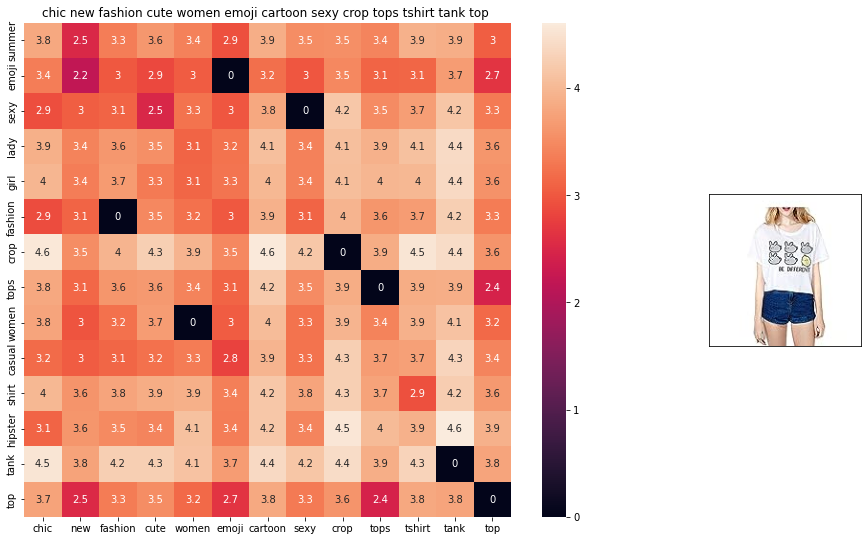

ASIN : B011UEWSFE
Brand : Chiclook Cool
euclidean distance from input : 0.6199925


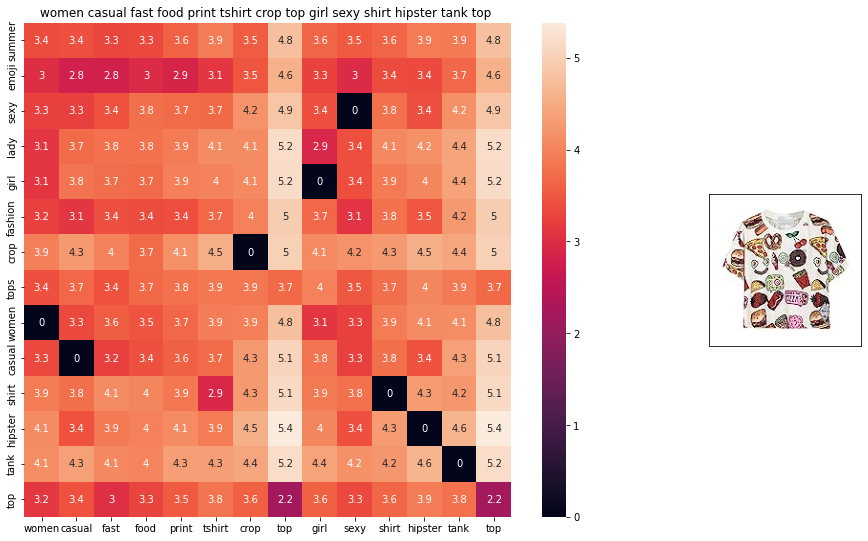

ASIN : B010V3AB5O
Brand : Doxi Supermall
euclidean distance from input : 0.6216878


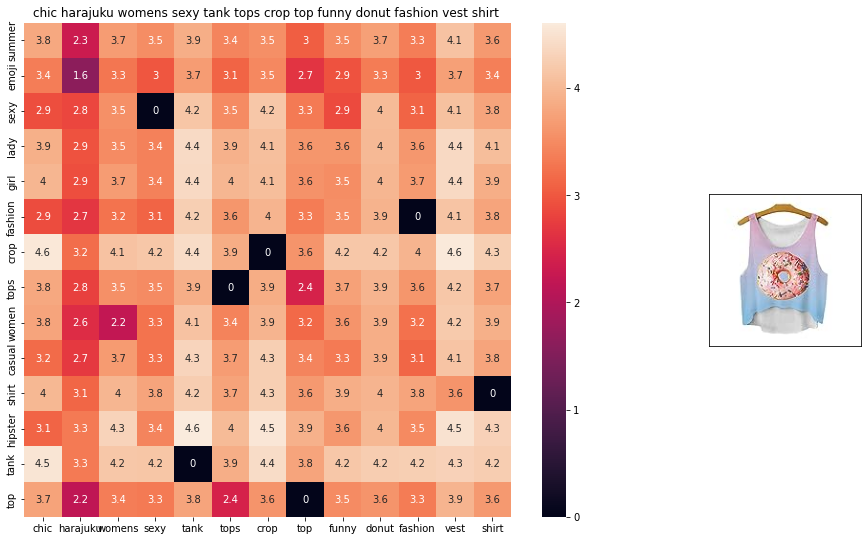

ASIN : B011RCIILC
Brand : Chiclook Cool
euclidean distance from input : 0.6299437


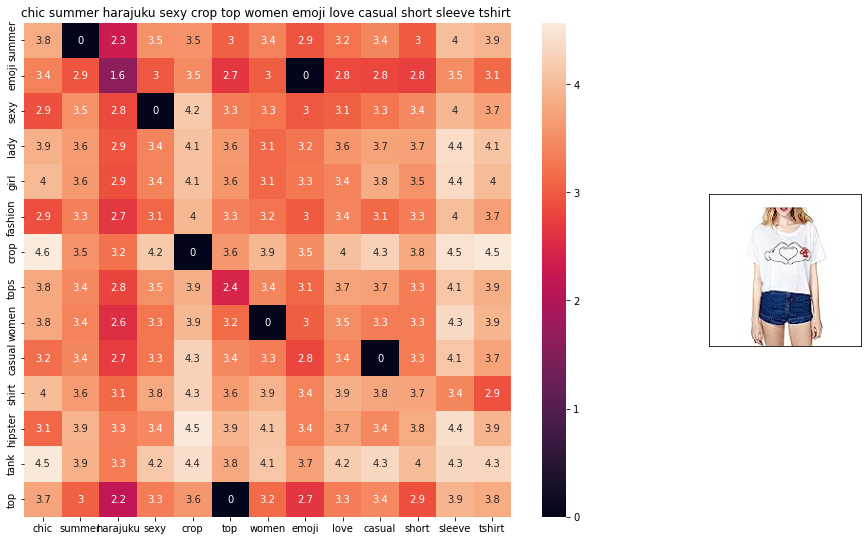

ASIN : B011UEVF4O
Brand : Chiclook Cool
euclidean distance from input : 0.6308715


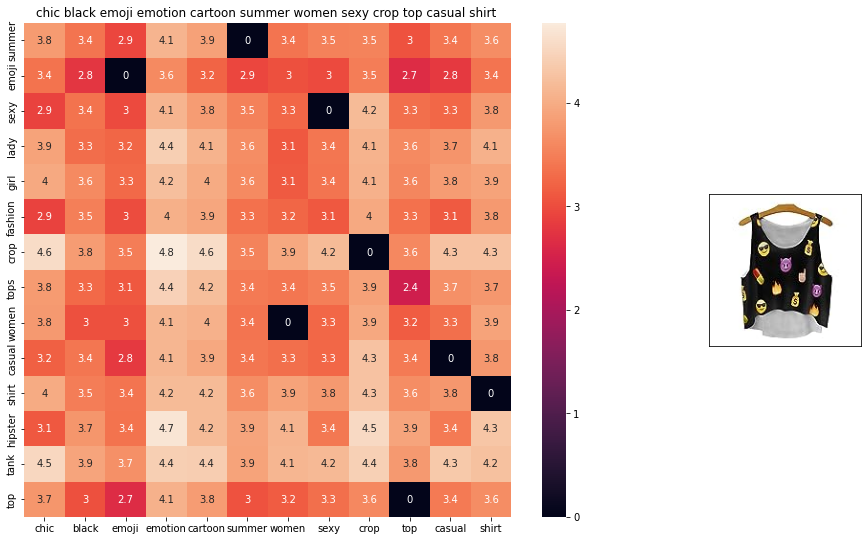

ASIN : B011RCJ4M4
Brand : Chiclook Cool
euclidean distance from input : 0.6319072


In [58]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(product_data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(product_data['title'].loc[df_indices[0]],product_data['title'].loc[df_indices[i]], product_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',product_data['asin'].loc[df_indices[i]])
        print('Brand :',product_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12566, 20)
#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

<h2>Weighted similarity using brand and color.</h2>

In [59]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
product_data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in product_data['brand'].values]
types = [x.replace(" ", "-") for x in product_data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in product_data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [60]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    product_data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [product_data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [product_data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(product_data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

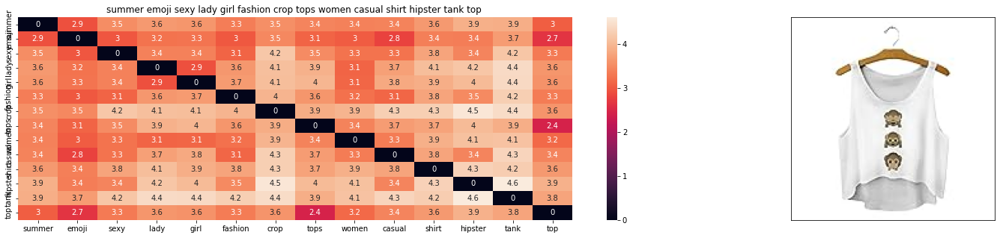

ASIN : B010V3BDII
Brand : Doxi Supermall
euclidean distance from input : 0.0


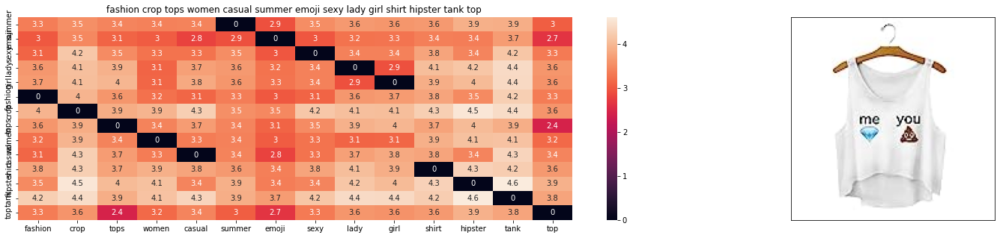

ASIN : B010V3B44G
Brand : Doxi Supermall
euclidean distance from input : 0.0


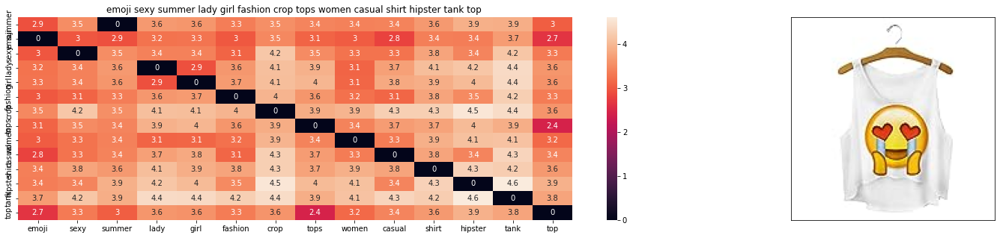

ASIN : B010V3BLWQ
Brand : Doxi Supermall
euclidean distance from input : 0.0


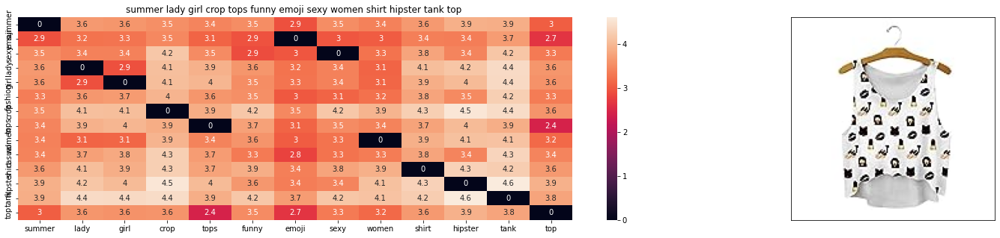

ASIN : B010V3BVMQ
Brand : Doxi Supermall
euclidean distance from input : 0.16373169422149658


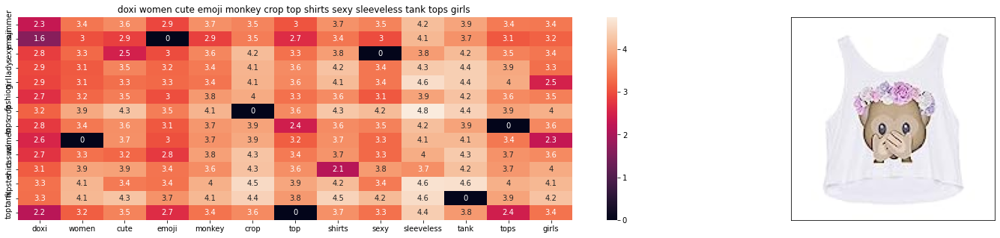

ASIN : B01LF90QTO
Brand : Doxi Supermall
euclidean distance from input : 0.3086388111114502


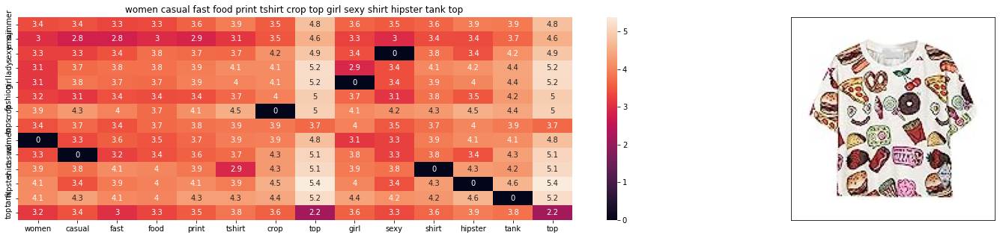

ASIN : B010V3AB5O
Brand : Doxi Supermall
euclidean distance from input : 0.3108439207077026


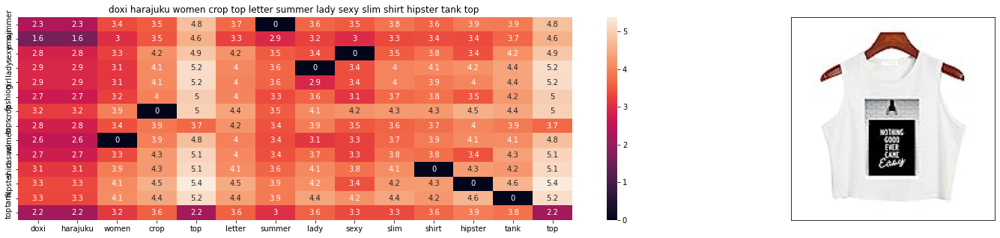

ASIN : B010V380LQ
Brand : Doxi Supermall
euclidean distance from input : 0.32540669441223147


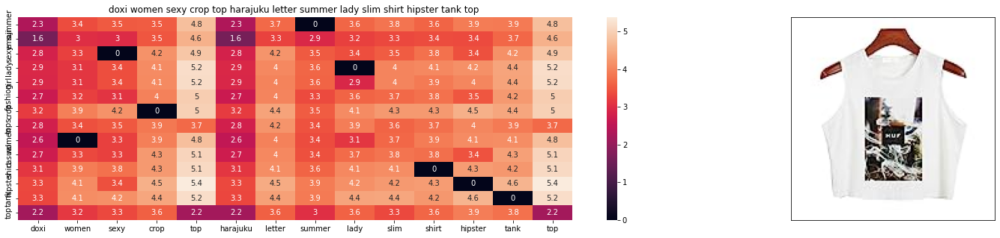

ASIN : B010V39146
Brand : Doxi Supermall
euclidean distance from input : 0.32540669441223147


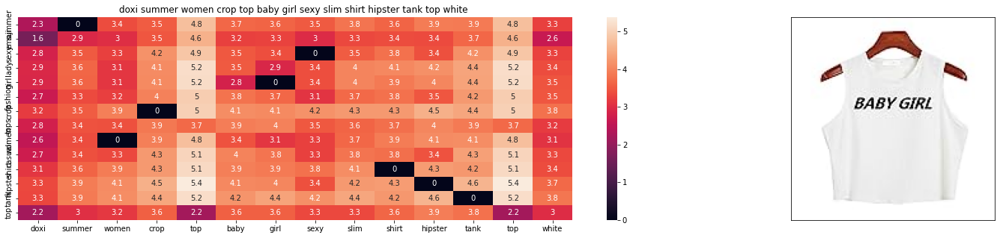

ASIN : B010V3A23U
Brand : Doxi Supermall
euclidean distance from input : 0.32969012260437014


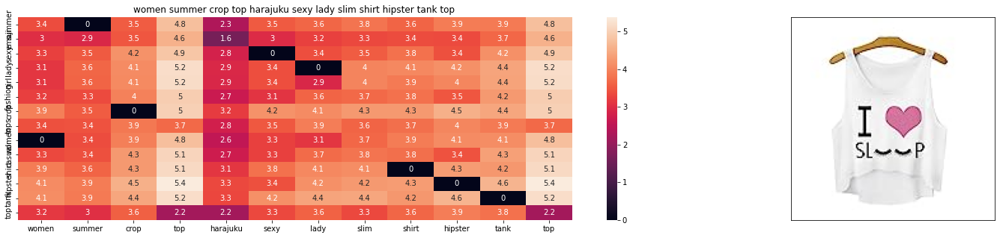

ASIN : B010V3EDEE
Brand : Doxi Supermall
euclidean distance from input : 0.3400482892990112


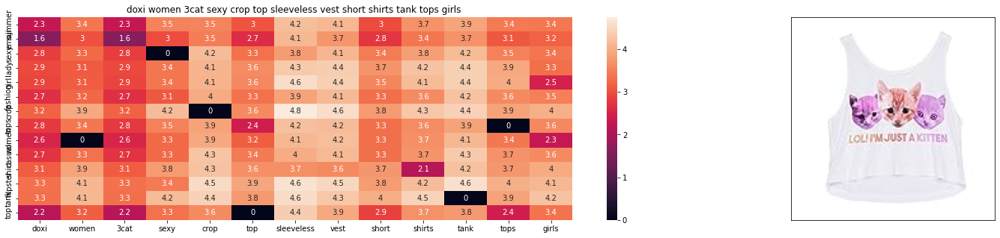

ASIN : B01LY4GQY0
Brand : Doxi Supermall
euclidean distance from input : 0.3469870567321777


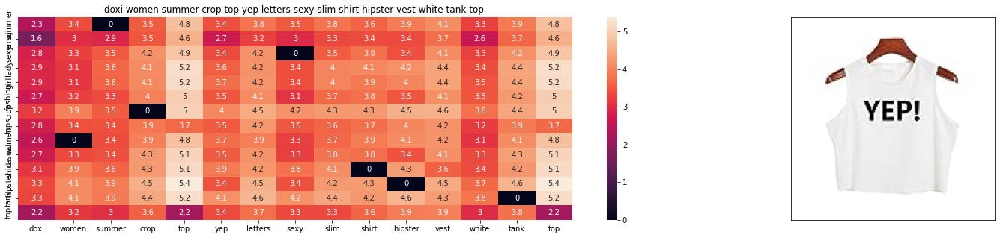

ASIN : B010V3487Q
Brand : Doxi Supermall
euclidean distance from input : 0.3695070266723633


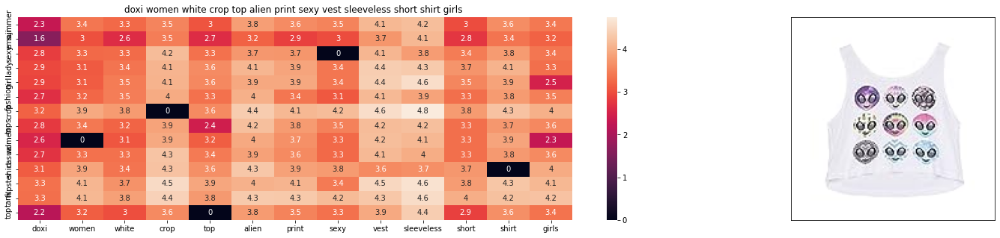

ASIN : B01LF90SCY
Brand : Doxi Supermall
euclidean distance from input : 0.37404048442840576


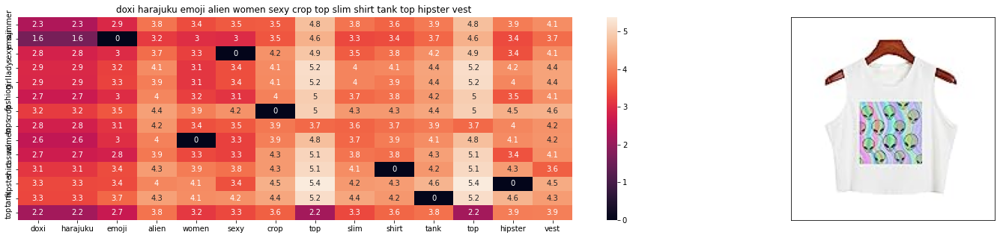

ASIN : B010TKXAI4
Brand : Doxi Supermall
euclidean distance from input : 0.37581453323364256


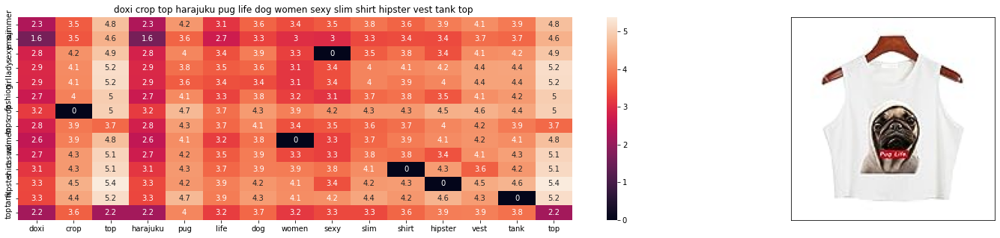

ASIN : B010V34IV2
Brand : Doxi Supermall
euclidean distance from input : 0.38526918888092043


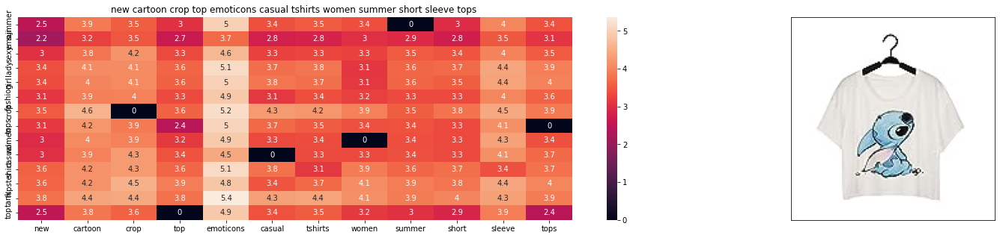

ASIN : B0124ED7NG
Brand : Doxi Supermall
euclidean distance from input : 0.38981435298919676


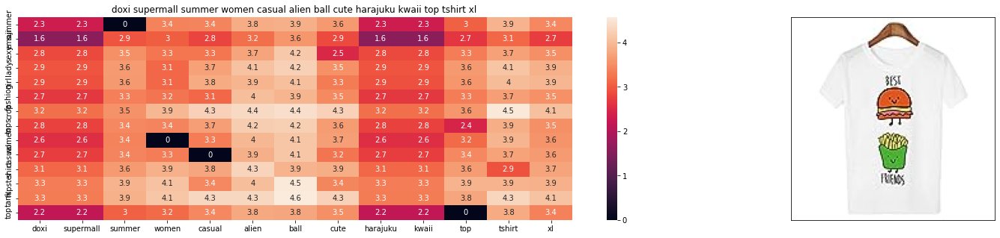

ASIN : B01JD6BR44
Brand : Doxi Supermall
euclidean distance from input : 0.398089075088501


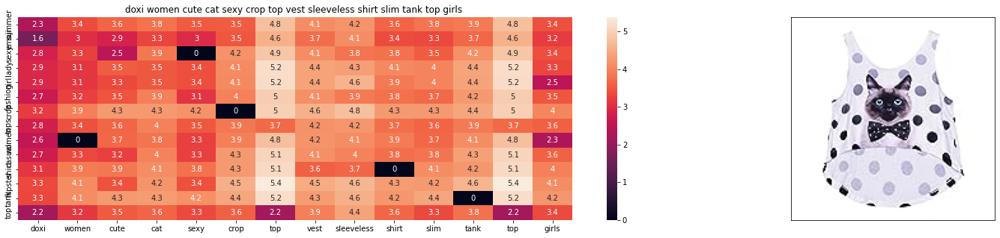

ASIN : B01LF90ROI
Brand : Doxi Supermall
euclidean distance from input : 0.4004617214202881


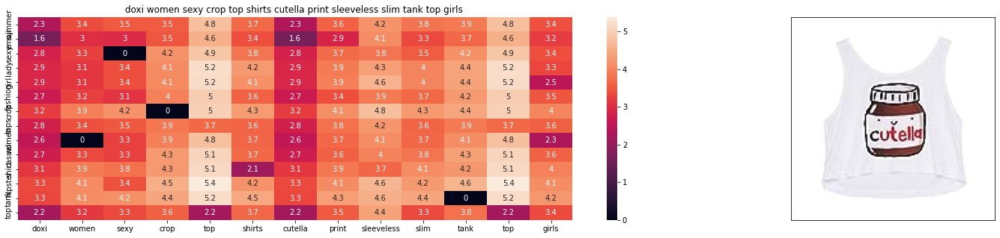

ASIN : B01LF90RKC
Brand : Doxi Supermall
euclidean distance from input : 0.4068887233734131


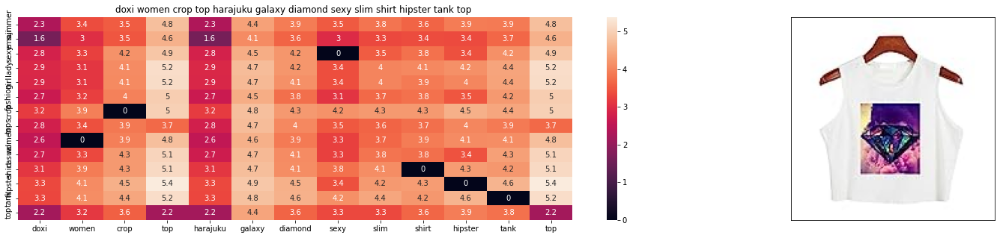

ASIN : B010V39EUM
Brand : Doxi Supermall
euclidean distance from input : 0.4164071559906006


In [61]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(product_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(product_data['title'].loc[df_indices[0]],product_data['title'].loc[df_indices[i]], product_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',product_data['asin'].loc[df_indices[i]])
        print('Brand :',product_data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

<h2>Keras and Tensorflow to extract features</h2>

In [ ]:
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import matplotlib.pyplot as plt
import requests
from PIL import Image
import pandas as pd
import pickle

In [ ]:
# https://gist.github.com/fchollet/f35fbc80e066a49d65f1688a7e99f069
# Code reference: https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html



# This code takes 40 minutes to run on a modern GPU (graphics card) 
# like Nvidia  1050.
# GPU (NVidia 1050): 0.175 seconds per image

# This codse takes 160 minutes to run on a high end i7 CPU
# CPU (i7): 0.615 seconds per image.

#Do NOT run this code unless you want to wait a few hours for it to generate output

# each image is converted into 25088 length dense-vector


'''
# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir = 'images2/'
nb_train_samples = 16042
epochs = 50
batch_size = 1


def save_bottlebeck_features():
    
    #Function to compute VGG-16 CNN for image feature extraction.
    
    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    
    # build the VGG16 network
    model = applications.VGG16(include_top=False, weights='imagenet')
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames:
        asins.append(i[2:-5])

    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)
    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))
    
    np.save(open('16k_data_cnn_features.npy', 'wb'), bottleneck_features_train)
    np.save(open('16k_data_cnn_feature_asins.npy', 'wb'), np.array(asins))
    

save_bottlebeck_features()

'''

<h1>Visual features based product similarity.</h1>

In [ ]:
#load the features and corresponding ASINS info.
import numpy as np
import pandas as pd
from sklearn.metrics import pairwise_distances
bottleneck_features_train = np.load('16k_data_cnn_features.npy')
asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)

# load the original 16K dataset
product_data = pd.read_pickle('pickels/16k_apperal_product_data_preprocessed')
df_asins = list(product_data['asin'])


from IPython.display import display, Image, SVG, Math, YouTubeVideo


#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = product_data[['medium_image_url','title']].loc[product_data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12566, 20)


1. Consider [text bow] + [brand] + [color] + [image]
======================================================

Weights are assigned for above
By default all weights are 1.

In [ ]:
def weighted_similarity(doc_id,num_results,text_vector,wt = 1,wb = 1,wc = 1,wi = 1):
    """
    This function consider 4 vectors.
    1. Text (by default tfidf w2v in considered.)
    2. Brand
    3. Color
    4. Feature Extracted image vector
    
    Weighted similarity vector is calculated based on weights provided.
    By default all weights are 1.
    
    Please pass the string which vectorizer to used.
    
    """
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # getting all the similarity distances for the given doc_id into into corresponding lists.
    
    if text_vector == "bow":
        # bow
        text_dist = pairwise_distances(title_features,title_features[doc_id])
    elif text_vector =="tfidf":
        # tfidf
        text_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])
    elif text_vector == "avg_w2v":
        # avg_w2v
        text_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))
    elif text_vector == "idf_w2v":
        # tfidf_avg_w2v
        text_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    
    brand_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    image_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    
    # calculating weighted vector.
    pairwise_dist   = ((wt * text_dist) +(wb * brand_dist) +(wc * color_dist) + (wi * image_dist))/float(wt + wb + wc + wi)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(product_data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(product_data['title'].loc[df_indices[0]],product_data['title'].loc[df_indices[i]], product_data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',product_data['asin'].loc[df_indices[i]])
        print('Brand :',product_data['brand'].loc[df_indices[i]])
        print('Color :',product_data['color'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

In [ ]:
weighted_similarity(12566,10,text_vector="avg_w2v",wt=5,wb=2,wc=2,wi=5)